# Import

In [1]:
import pycpt
import packaging
min_version = '2.6.1'
assert packaging.version.parse(pycpt.__version__) >= packaging.version.parse(min_version), f'This notebook requires version {min_version} or higher of the pycpt library, but you have version {pycpt.__version__}. Please close the notebook, update your environment, and load the notebook again. See https://iri-pycpt.github.io/installation/'

import cptdl as dl 
from cptextras import get_colors_bars
import datetime as dt
import numpy as np
from pathlib import Path
import xarray as xr
import cptcore as cc
import scipy.ndimage as ndimage
import matplotlib.pyplot as plt
import pandas as pd
import cv2
from dateutil.relativedelta import relativedelta
import cartopy.crs as ccrs
from scipy.stats import pearsonr
import scipy as sp

In [2]:
spi01 = xr.open_dataset('data/spi01.nc')
#change time format to MM-YYYY
spi01['time'] = pd.to_datetime(spi01.time.values).strftime('%m-%Y')
#rename dims to T, X, Y
spi01 = spi01.rename({'time':'T', 'latitude':'Y', 'longitude':'X'})
#change T format to MM-YYYY
spi01['T'] = pd.to_datetime(spi01.T.values).strftime('%m-%Y')
spi01['T'] = pd.to_datetime(spi01.T.values)
#keep only since 01-79
#spi01 = spi01.sel(T=slice('01-1979', None))
#count number of infinite values 
np.sum(np.isinf(spi01['spi'].values))
#replace values aboe 1e10 with 10
print(np.sum(np.isinf(spi01['spi'].values)))
#spi01['spi'] = xr.where(spi01['spi']>1e10, 10, spi01['spi'])
#print dates where spi is infinite

spi01 = spi01.sel(X=slice(32, 60))



C:\Users\emile\AppData\Local\Temp\ipykernel_16660\599595129.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spi01['T'] = pd.to_datetime(spi01.T.values).strftime('%m-%Y')
C:\Users\emile\AppData\Local\Temp\ipykernel_16660\599595129.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spi01['T'] = pd.to_datetime(spi01.T.values)


0


In [3]:
spei01 = xr.open_dataset('data/spei01.nc')
#change time format to MM-YYYY
spei01['time'] = pd.to_datetime(spei01.time.values).strftime('%m-%Y')
#rename dims to T, X, Y
spei01 = spei01.rename({'time':'T', 'latitude':'Y', 'longitude':'X'})
#change T format to MM-YYYY
spei01['T'] = pd.to_datetime(spei01.T.values).strftime('%m-%Y')
spei01['T'] = pd.to_datetime(spei01.T.values)
#keep only since 01-79
#spei01 = spei01.sel(T=slice('01-1979', None))
#count number of infinite values 
np.sum(np.isinf(spei01['spei'].values))
#replace values aboe 1e10 with 10
print(np.sum(np.isinf(spei01['spei'].values)))
#spei01['spei'] = xr.where(spei01['spei']>1e10, 10, spei01['spei'])
#print dates where spei is infinite

spei01 = spei01.sel(X=slice(32, 60))

C:\Users\emile\AppData\Local\Temp\ipykernel_16660\477816680.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spei01['T'] = pd.to_datetime(spei01.T.values).strftime('%m-%Y')
C:\Users\emile\AppData\Local\Temp\ipykernel_16660\477816680.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spei01['T'] = pd.to_datetime(spei01.T.values)


0


In [4]:
cams01 = xr.open_dataset('data/cams01.nc', decode_times=False)
reference_time = pd.Timestamp('1960-01-01')
# Apply the conversion to each time value in 'T'
cams01['T'] = xr.DataArray([reference_time + relativedelta(months=int(month)) for month in cams01['T'].values])
# Format the time as month-year (MM-YYYY)
cams01['T'] = cams01['T'].dt.strftime('%m-%Y')
cams01['T'] = pd.to_datetime(cams01['T'])
np.sum(np.isinf(cams01['SPI-CAMSOPI_1-Month'].values))
cams01 = cams01.sel(X=slice(32, 60))


C:\Users\emile\AppData\Local\Temp\ipykernel_16660\3615512227.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  cams01['T'] = pd.to_datetime(cams01['T'])


In [5]:
opi = xr.open_dataset('data/opi.nc', decode_times=False)
# Apply the conversion to each time value in 'T'
opi['T'] = xr.DataArray([reference_time + relativedelta(months=int(month)) for month in opi['T'].values])
# Format the time as month-year (MM-YYYY)

opi['T'] = opi['T'].dt.strftime('%m-%Y')
opi['T'] = pd.to_datetime(opi['T'])
#rename dim_0 to T
#opi = opi.swap_dims({'dim_0':'T'})

opi = opi.sel(X=slice(32, 60))


C:\Users\emile\AppData\Local\Temp\ipykernel_16660\2605572955.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  opi['T'] = pd.to_datetime(opi['T'])


In [6]:
era5 = xr.open_dataset('data/era5.nc', decode_times=False)
#time is YYYMMDD change ot datetime
# Convert to pandas datetime using the correct format
date_times = pd.to_datetime(era5.date.values.astype(str), format='%Y%m%d')
# Assign the datetime values back to the DataArray if needed
era5 = era5.swap_dims({'date':'T', 'longitude':'X', 'latitude':'Y'})
era5 = era5.assign_coords(T=date_times, X = era5.longitude, Y = era5.latitude)
#remove coordinate date
era5 = era5.drop(['date','latitude', 'longitude', 'expver','number'])

#era5 = era5.sel(T=slice('1979-01-01', '2024-08-01'))

era5['tp'] = era5['tp']*1000*30

C:\Users\emile\AppData\Local\Temp\ipykernel_16660\118738815.py:9: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  era5 = era5.drop(['date','latitude', 'longitude', 'expver','number'])


In [7]:
custom_spi = xr.open_dataset('data/custom_spi_pearson3v2_1m.nc', decode_times=True)

# Merge

In [8]:
#merge spi01 and cams01
spi01_cams01 = spi01.merge(cams01)
#merge spi01_cams01 and opi
data = spi01_cams01.merge(opi)
data = data.merge(spei01) 

data = data.merge(era5)
data = data.merge(custom_spi)

data = data.sel(T=slice('01-1951', '08-2024'))


In [9]:
#rename data variables and transpose dims to T, X, Y
data = data.rename({'spi':'KAUST_SPI', 'SPI-CAMSOPI_1-Month':'CAMS_SPI', 'aprod':'CAMS_precip','__xarray_dataarray_variable__':'custom_SPI', 'tp':'KAUST_precip',
                    'spei':'KAUST_SPEI'})
data['KAUST_SPI'] = data['KAUST_SPI'].transpose('T', 'Y', 'X')
data['CAMS_SPI'] = data['CAMS_SPI'].transpose('T', 'Y', 'X')
data['CAMS_precip'] = data['CAMS_precip'].transpose('T', 'Y', 'X')
data['KAUST_precip'] = data['KAUST_precip'].transpose('T', 'Y', 'X')
data['KAUST-SPEI'] = data['KAUST_SPEI'].transpose('T', 'Y', 'X')

data['custom_SPI'] = xr.where(data['custom_SPI']>1e10, 3, data['custom_SPI'])
data['KAUST_SPI'] = xr.where(data['KAUST_SPI']>1e10, 3, data['KAUST_SPI'])

In [10]:
data 

<xarray.Dataset> Size: 323MB
Dimensions:       (T: 884, Y: 101, X: 113)
Coordinates:
  * T             (T) datetime64[ns] 7kB 1951-01-01 1951-02-01 ... 2024-08-01
  * Y             (Y) float64 808B 12.0 12.25 12.5 12.75 ... 36.5 36.75 37.0
  * X             (X) float32 452B 32.0 32.25 32.5 32.75 ... 59.5 59.75 60.0
Data variables:
    KAUST_SPI     (T, Y, X) float32 40MB -1.0 -1.012 -1.035 ... 0.4232 1.045
    CAMS_SPI      (T, Y, X) float32 40MB nan nan nan ... 0.1738 0.2337 0.2936
    CAMS_precip   (T, Y, X) float32 40MB nan nan nan ... -0.1653 -0.1656 -0.1658
    KAUST_SPEI    (T, Y, X) float32 40MB 0.6233 0.3924 ... -0.4065 -0.1485
    KAUST_precip  (T, Y, X) float32 40MB 0.0 0.0 0.0 0.0 ... 3.605 1.259 0.4005
    custom_SPI    (T, Y, X) float64 81MB 1.349 1.274 1.143 ... -0.1141 1.615
    KAUST-SPEI    (T, Y, X) float32 40MB 0.6233 0.3924 ... -0.4065 -0.1485

# Spatial smoothing

In [11]:
#spatial smoothing for custom SPI
smooth = True
if smooth:
    for i in range(len(data['T'])):
        data['custom_SPI'][i] = sp.ndimage.filters.gaussian_filter(data['custom_SPI'][i], sigma=[1,1], mode='constant')



C:\Users\emile\AppData\Local\Temp\ipykernel_16660\1893971997.py:5: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  data['custom_SPI'][i] = sp.ndimage.filters.gaussian_filter(data['custom_SPI'][i], sigma=[1,1], mode='constant')


In [12]:
mask = data.KAUST_SPI.isnull()
#apply mask to other data variables
data['CAMS_SPI'] = data.CAMS_SPI.where(~mask)
data['CAMS_precip'] = data.CAMS_precip.where(~mask)
data['KAUST_precip'] = data.KAUST_precip.where(~mask)
data['custom_SPI'] = data.custom_SPI.where(~mask)
data['KAUST_SPEI'] = data.KAUST_SPEI.where(~mask)

# Compute ERA5 anomaly

In [13]:
array_list = []
for month in range(1, 13):
    reference_period = data['KAUST_precip'].sel(T=data['T.month']==month).sel(T=slice('1991-01-01', '2020-12-01'))
    data_month = data['KAUST_precip'].sel(T=data['T.month']==month)
    data_month = (data_month - reference_period.mean(dim='T') )  / (reference_period.std(dim='T') + 1e-10)
    array_list.append(data_month)
era5_anomalies = xr.concat(array_list, dim='T')
  

In [14]:
data['KAUST_precip_anomalies'] = era5_anomalies

# Key Dates 

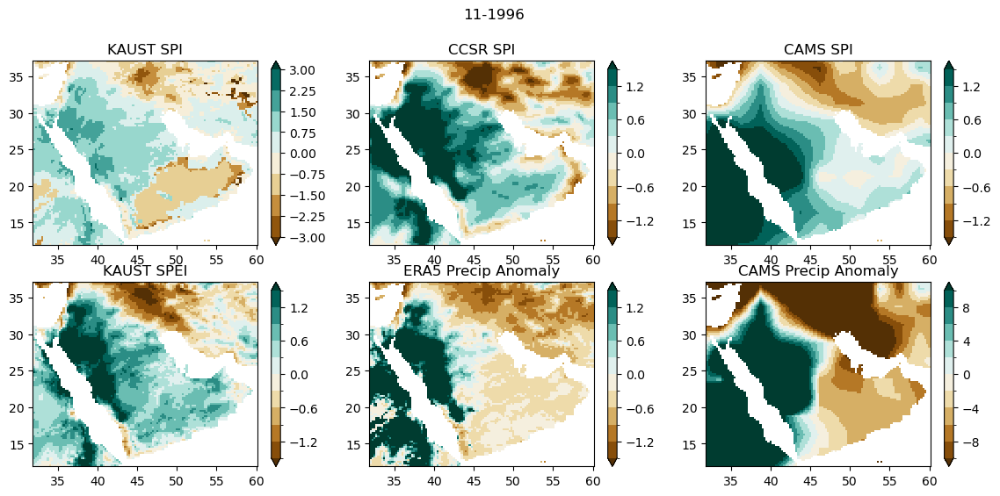

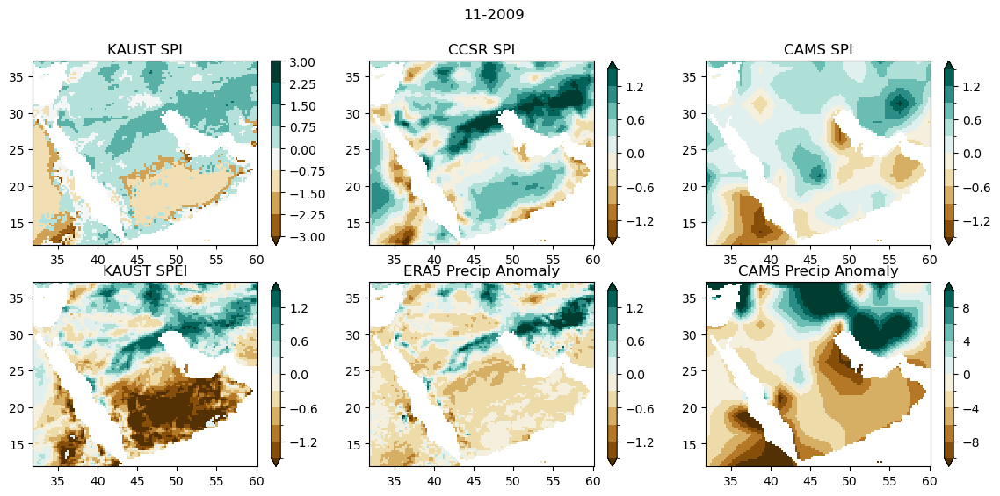

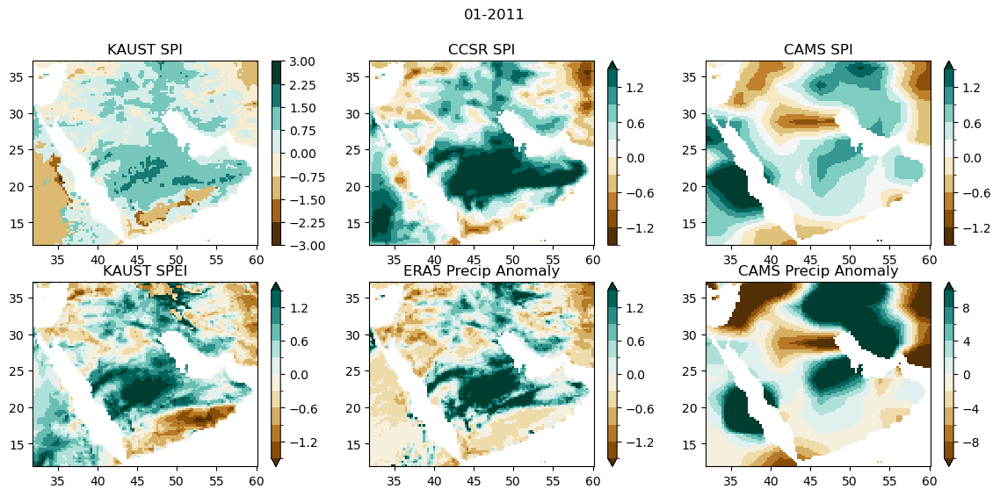

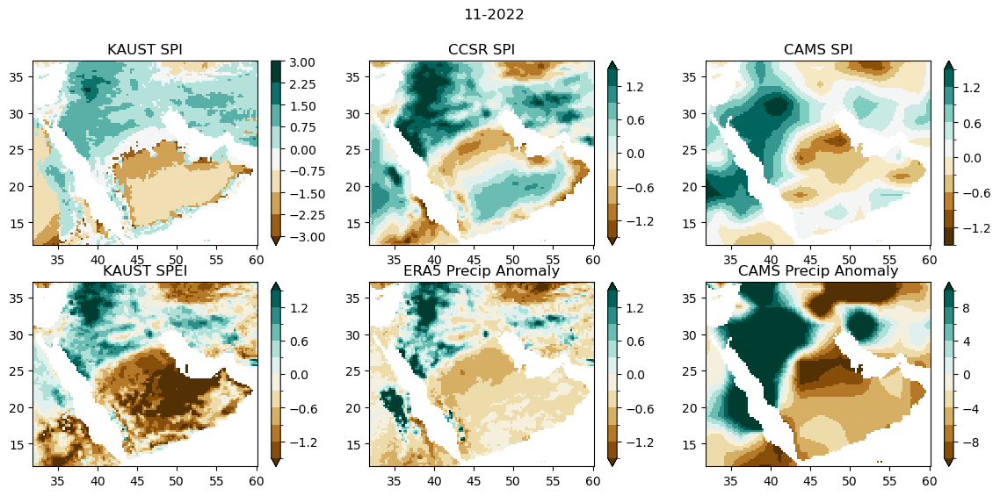

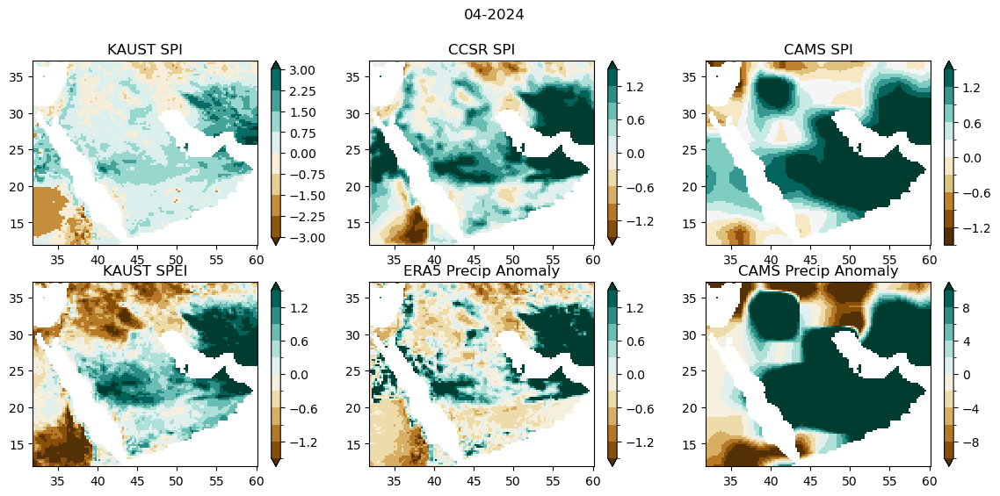

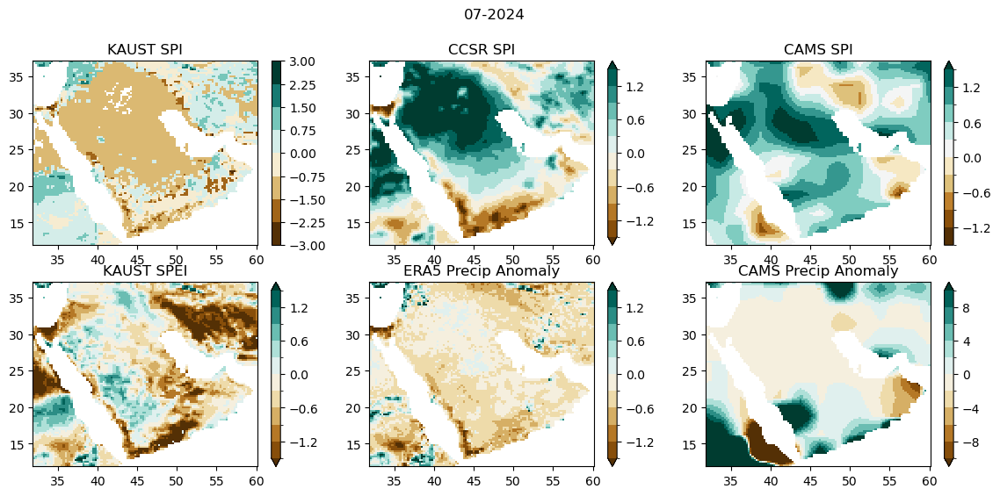

In [15]:
# Create a figure with 3 subplots (one row, three columns)
def plot_date(string):
    fig, axs = plt.subplots(2, 3, figsize=(14, 6))

    # Plot the three variables remove X and Y labels
    data.sel(T=string).KAUST_SPI.plot(ax=axs[0, 0], vmin=-3, vmax=3,cmap='BrBG', levels=9,cbar_kwargs={'label': ''})
    axs[0, 0].set_title('KAUST SPI')
    data.sel(T=string).custom_SPI.plot(ax=axs[0, 1], vmin=-1.5, vmax=1.5,cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
    axs[0, 1].set_title('CCSR SPI')
    data.sel(T=string).CAMS_SPI.plot(ax=axs[0, 2], vmin=-1.5, vmax=1.5,cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
    axs[0, 2].set_title('CAMS SPI')
    data.sel(T=string).KAUST_SPEI.plot(ax=axs[1, 0], vmin=-1.5, vmax=1.5,cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
    axs[1, 0].set_title('KAUST SPEI')
    data.sel(T=string).KAUST_precip_anomalies.plot(ax=axs[1, 1], vmin=-1.5, vmax=1.5,cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
    axs[1, 1].set_title('ERA5 Precip Anomaly')
    data.sel(T=string).CAMS_precip.plot(ax=axs[1, 2], vmin=-10, vmax=10,cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
    axs[1, 2].set_title('CAMS Precip Anomaly')
    #remove X and Y labels
    for ax in axs.flat:
        ax.set(xlabel='', ylabel='')

    # Adjust layout for better appearance
    #plt.tight_layout()
    plt.suptitle(string)
    plt.show()

plot_date('11-1996')
plot_date('11-2009')
plot_date('01-2011')
plot_date('11-2022')
plot_date('04-2024')
plot_date('07-2024')

# Top years

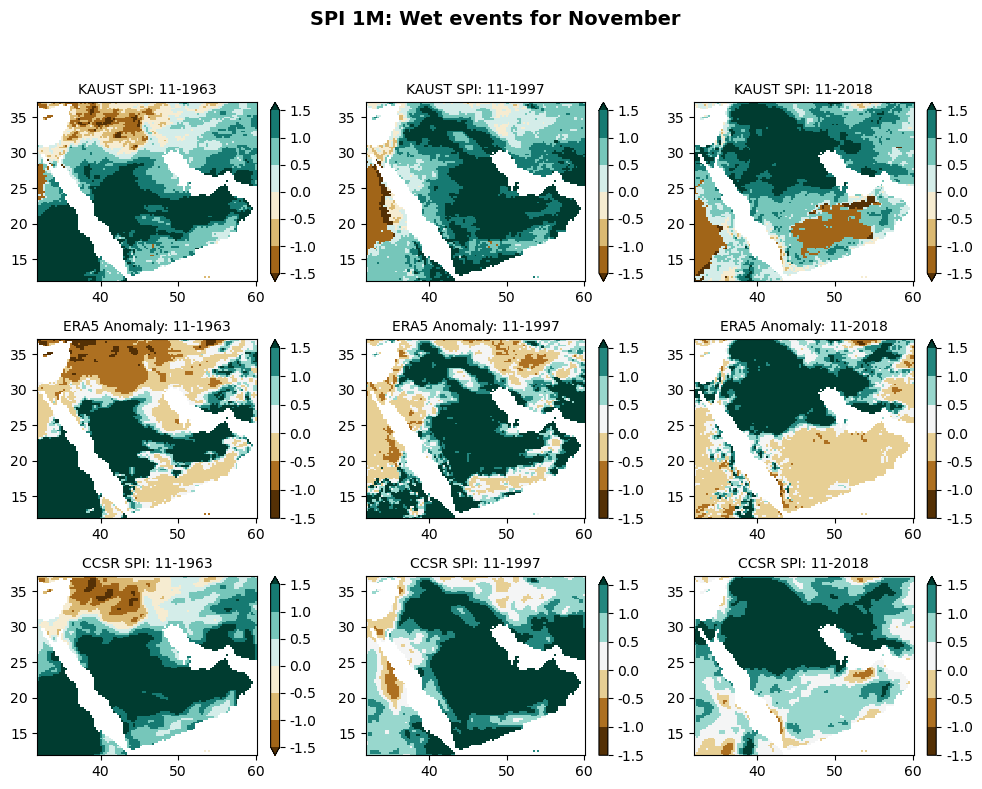

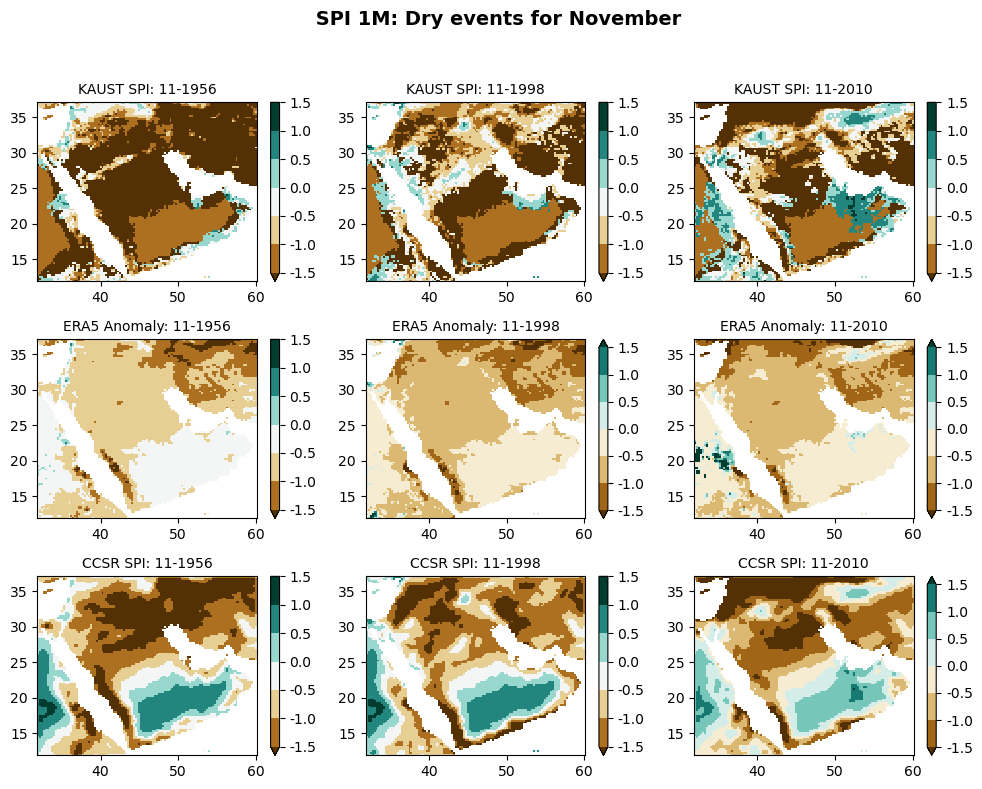

In [19]:
month = 11
month_name = 'November'

def get_top_bottom_dates(data_var,month=month):
    # Calculate the mean across X and Y
    data_var_month = data_var.sel(T=data_var['T'].dt.month==month)
    mean_values = data_var_month.mean(dim=['X', 'Y'])

    # Sort and get the indices of the top 5 and bottom 5 values
    sorted_indices = mean_values.argsort()

    # Get top 5 and bottom 5 indices
    top_5_indices = sorted_indices[-3:].values
    bottom_5_indices = sorted_indices[:3].values

    # Get the corresponding dates for top 5 and bottom 5
    top_5_dates = data_var_month['T'][top_5_indices].values
    bottom_5_dates = data_var_month['T'][bottom_5_indices].values

    #sort tyhe dates chromologically
    top_5_dates = sorted(top_5_dates)
    bottom_5_dates = sorted(bottom_5_dates)

    return top_5_dates, bottom_5_dates

# Get top 5 and bottom 5 dates for each variable
kaust_top_5, kaust_bottom_5 = get_top_bottom_dates(data['KAUST_SPI'])
era5_top_5, era5_bottom_5 = get_top_bottom_dates(data['KAUST_precip_anomalies'])
custom_top_5, custom_bottom_5 = get_top_bottom_dates(data['custom_SPI'])
spei_top_5, spei_bottom_5 = get_top_bottom_dates(data['KAUST_SPEI'])

era5_top_5 = kaust_top_5
era5_bottom_5 = kaust_bottom_5

vmin = -1.5
vmax = 1.5
levels = 7
cbar_kwargs={'label': '','format': '%.1f','ticks': np.arange(-3, 3.1, 0.5)}
fig, axes = plt.subplots(3, 3, figsize=(10, 8))
    # Top row (highest 5)
for i, date in enumerate(kaust_top_5):
    #format date to MM-YYYY
    date_str = pd.Timestamp(date).strftime('%m-%Y') 
    ax = axes[0, i]
    data['KAUST_SPI'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=levels,cbar_kwargs = cbar_kwargs)
    ax.set_title(f"KAUST SPI: {date_str}", fontsize=10)
    ax.set(xlabel='', ylabel='')

    # Bottom row (lowest 5)
for i, date in enumerate(era5_top_5):
    #format date to MM-YYYY
    date_str = pd.Timestamp(date).strftime('%m-%Y') 
    ax = axes[1, i]
    data['KAUST_precip_anomalies'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=levels, cbar_kwargs=cbar_kwargs)  
    ax.set_title(f"ERA5 Anomaly: {date_str}", fontsize=10)
    ax.set(xlabel='', ylabel='')

for i, date in enumerate(custom_top_5):
    #format date to MM-YYYY
    date_str = pd.Timestamp(date).strftime('%m-%Y') 
    ax = axes[2, i]
    data['custom_SPI'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=levels, cbar_kwargs=cbar_kwargs)
    ax.set_title(f"CCSR SPI: {date_str}", fontsize=10)
    ax.set(xlabel='', ylabel='')

# for i, date in enumerate(spei_top_5):
#     #format date to MM-YYYY
#     date_str = pd.Timestamp(date).strftime('%m-%Y')
#     ax = axes[3, i]
#     data['KAUST_SPEI'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
#     ax.set_title(f"KAUST SPEI Top {i+1}: {date_str}", fontsize=10)
#     ax.set(xlabel='', ylabel='')


    # Set overall title
plt.suptitle(f"SPI 1M: Wet events for {month_name}", fontsize=14,fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


fig, axes = plt.subplots(3, 3, figsize=(10, 8))
    # Top row (highest 5)
for i, date in enumerate(kaust_bottom_5):
    #format date to MM-YYYY
    date_str = pd.Timestamp(date).strftime('%m-%Y') 
    ax = axes[0, i]
    data['KAUST_SPI'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=levels,cbar_kwargs=cbar_kwargs)
    ax.set_title(f"KAUST SPI: {date_str}", fontsize=10)
    ax.set(xlabel='', ylabel='')

    # Bottom row (lowest 5)
for i, date in enumerate(era5_bottom_5):
    #format date to MM-YYYY
    date_str = pd.Timestamp(date).strftime('%m-%Y') 
    ax = axes[1, i]
    data['KAUST_precip_anomalies'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=levels,cbar_kwargs=cbar_kwargs)
    ax.set_title(f"ERA5 Anomaly: {date_str}", fontsize=10)
    ax.set(xlabel='', ylabel='')

for i, date in enumerate(custom_bottom_5):
    #format date to MM-YYYY
    date_str = pd.Timestamp(date).strftime('%m-%Y') 
    ax = axes[2, i]
    data['custom_SPI'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=levels,cbar_kwargs=cbar_kwargs)
    ax.set_title(f"CCSR SPI: {date_str}", fontsize=10)
    ax.set(xlabel='', ylabel='')

# for i, date in enumerate(spei_bottom_5):
#     #format date to MM-YYYY
#     date_str = pd.Timestamp(date).strftime('%m-%Y')
#     ax = axes[3, i]
#     data['KAUST_SPEI'].sel(T=date).plot(ax=ax, vmin=vmin, vmax=vmax, cmap='BrBG', levels=11,cbar_kwargs={'label': ''})
#     ax.set_title(f"KAUST SPEI Top {i+1}: {date_str}", fontsize=10)
#     ax.set(xlabel='', ylabel='')

    # Set overall title
plt.suptitle(f" SPI 1M: Dry events for {month_name}", fontsize=14,fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Correlations

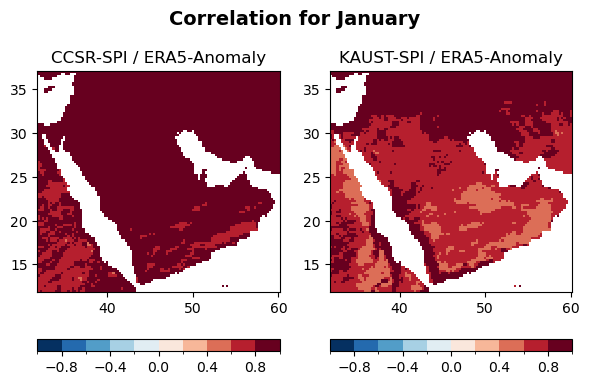

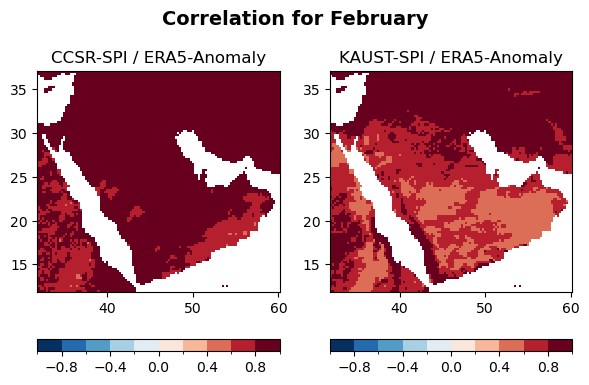

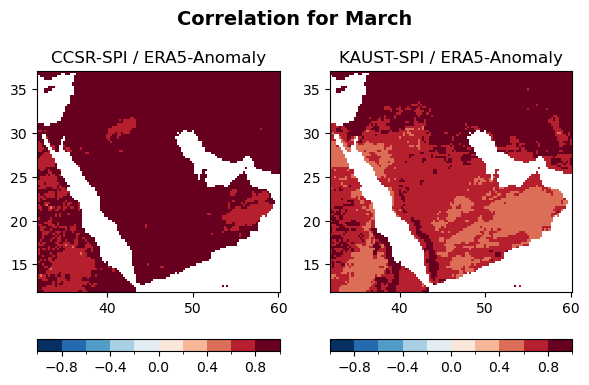

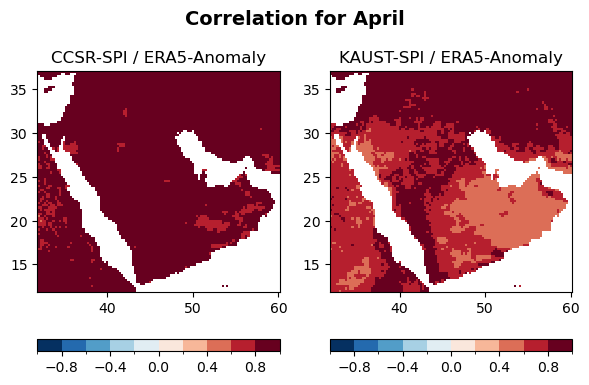

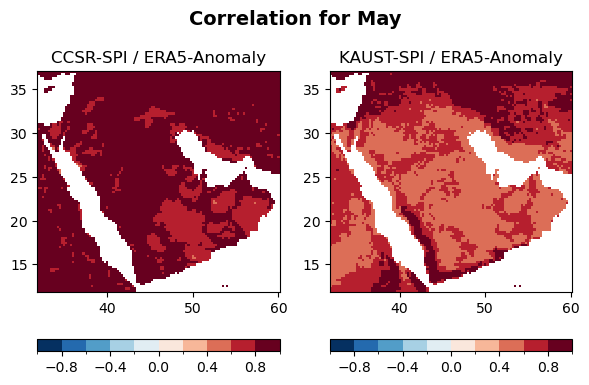

...

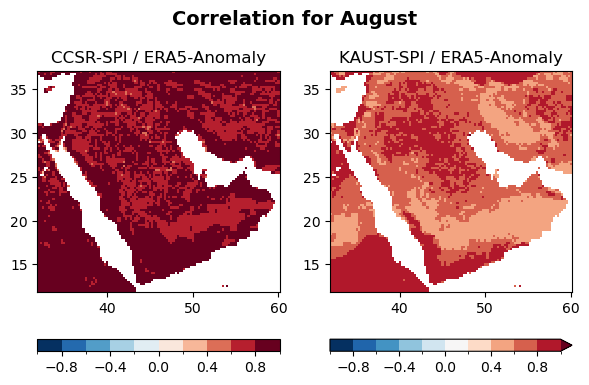

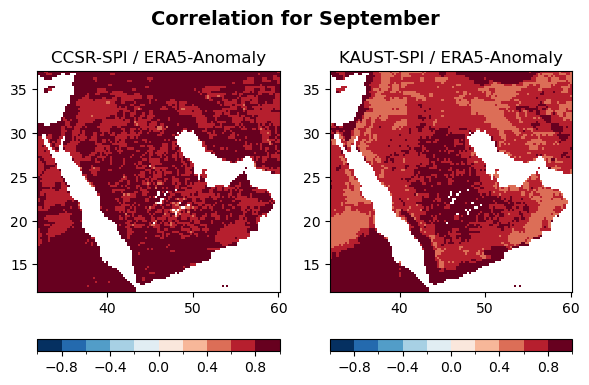

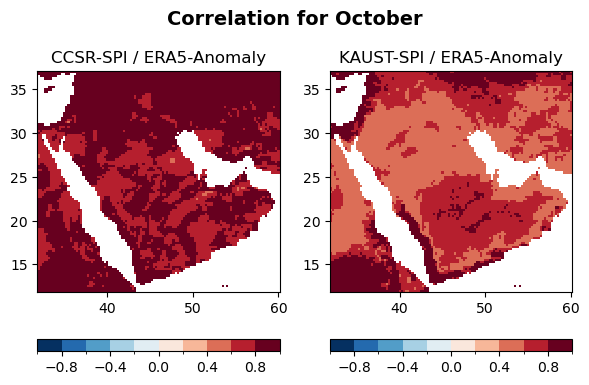

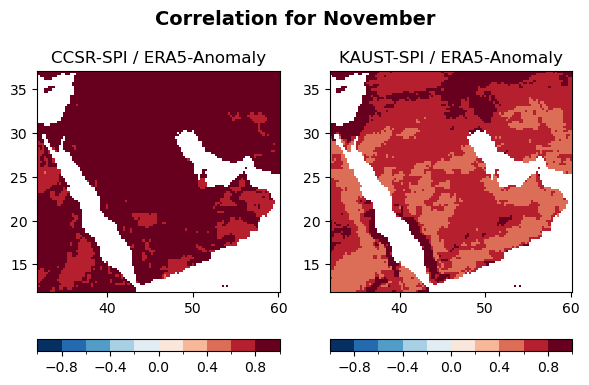

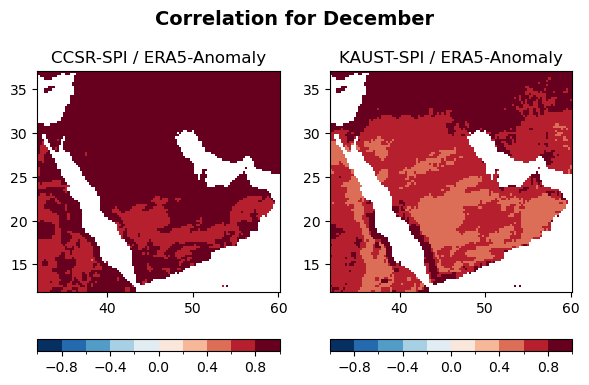

In [17]:
def compute_gridwise_correlation(data, var1, var2, var3, var4,var5):


    # Ensure the time coordinate is in datetime format and extract the month
    if data['T'].dtype != 'datetime64[ns]':
        data['T'] = pd.to_datetime(data['T'].values, format='%m-%Y')
    months = data['T'].dt.month

    
    # Prepare an empty dataset to store the correlations for each month
    corr_ds = xr.Dataset()
    # Loop over each month
    for month in range(1, 13):  # Months 1 to 12
        # Select data for the specific month
        monthly_data = data.where(months == month, drop=True)

        # Compute correlations for each pair of variables using xarray's corr method
        corr1_2 = xr.corr(monthly_data[var1], monthly_data[var2], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr1_3 = xr.corr(monthly_data[var1], monthly_data[var3], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr2_3 = xr.corr(monthly_data[var2], monthly_data[var3], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr1_4 = xr.corr(monthly_data[var1], monthly_data[var4], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr2_4 = xr.corr(monthly_data[var2], monthly_data[var4], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr3_4 = xr.corr(monthly_data[var3], monthly_data[var4], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr1_5 = xr.corr(monthly_data[var1], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr2_5 = xr.corr(monthly_data[var2], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr3_5 = xr.corr(monthly_data[var3], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr4_5 = xr.corr(monthly_data[var4], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
    

        # Store the correlation results in the dataset using X and Y coordinates from the first variable
        corr_ds[f'corr_{var1}_{var2}_month_{month}'] = corr1_2
        corr_ds[f'corr_{var1}_{var3}_month_{month}'] = corr1_3
        corr_ds[f'corr_{var2}_{var3}_month_{month}'] = corr2_3
        corr_ds[f'corr_{var1}_{var4}_month_{month}'] = corr1_4
        corr_ds[f'corr_{var2}_{var4}_month_{month}'] = corr2_4
        corr_ds[f'corr_{var3}_{var4}_month_{month}'] = corr3_4
        corr_ds[f'corr_{var1}_{var5}_month_{month}'] = corr1_5
        corr_ds[f'corr_{var2}_{var5}_month_{month}'] = corr2_5
        corr_ds[f'corr_{var3}_{var5}_month_{month}'] = corr3_5
        corr_ds[f'corr_{var4}_{var5}_month_{month}'] = corr4_5


    return corr_ds

# Compute the gridwise correlation between KAUST, CAMS, and SPI
corr_ds = compute_gridwise_correlation(data, 'KAUST_SPI', 'CAMS_SPI', 'KAUST_precip_anomalies', 'KAUST_SPEI', 'custom_SPI')



# Plot the gridwise correlation for each month (var1 vs var2)
for month in range(1, 13):
    month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
    month_name = month_names[month - 1]
    plt.figure(figsize=(6, 4))

    # Plot correlation between KAUST and CAMS
    plt.subplot(1, 2, 1)
    corr_map = corr_ds[f'corr_KAUST_precip_anomalies_custom_SPI_month_{month}']
    corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=True,levels=11,cbar_kwargs={'label': '','orientation': 'horizontal'})
    plt.title(f'CCSR-SPI / ERA5-Anomaly')

    # Plot correlation between KAUST and SPI
    plt.subplot(1, 2, 2)
    corr_map = corr_ds[f'corr_KAUST_SPI_KAUST_precip_anomalies_month_{month}']
    corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=True,levels=11,cbar_kwargs={'label': '','orientation': 'horizontal'})
    plt.title(f'KAUST-SPI / ERA5-Anomaly')

    # # Plot correlation between CAMS and SPI
    # plt.subplot(1, 5, 3)
    # corr_map = corr_ds[f'corr_KAUST_precip_anomalies_KAUST_SPEI_month_{month}']
    # corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=False,levels=11)
    # plt.title(f'KAUST-SPEI / ERA5-prcp - Month {month}')

    # plt.subplot(1, 5, 4)
    # corr_map = corr_ds[f'corr_KAUST_SPI_custom_SPI_month_{month}']
    # corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=False,levels=11)
    # plt.title(f'KAUST-SPI / CCSR-SPI - Month {month}')

    # plt.subplot(1, 5, 5)
    # corr_map = corr_ds[f'corr_KAUST_precip_anomalies_custom_SPI_month_{month}']
    # corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=True,levels=11)
    # plt.title(f'CCSR SPI / ERA5-prcp - Month {month}')
    #remove X and Y labels
    for ax in plt.gcf().axes:
        ax.set(xlabel='', ylabel='')
    plt.suptitle(f'Correlation for {month_name}', fontsize=14,fontweight='bold')
    plt.tight_layout()
    plt.show()

## Time series

C:\Users\emile\AppData\Local\Temp\ipykernel_14824\2768243119.py:53: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])


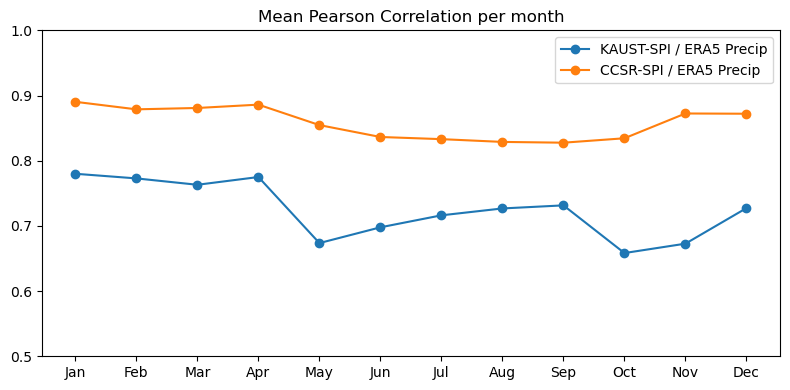

In [18]:
corr_kaust_custom = np.zeros(12)
corr_kaust_cams = np.zeros(12)
corr_cams_opi = np.zeros(12)
corr_kaust_era5 = np.zeros(12)
corr_custom_era5 = np.zeros(12)
corr_cams_era5 = np.zeros(12)
corr_spei_era5 = np.zeros(12)
corr_spei_custom = np.zeros(12)
months = np.arange(1, 13)
for month in months:
    data_month = data.where(data['T'].dt.month == month, drop=True)

    corr_mat_kaust_custom = xr.corr(data_month['KAUST_SPI'], data_month['custom_SPI'], dim='T')
    corr_mat_kaust_cams = xr.corr(data_month['KAUST_SPI'], data_month['CAMS_SPI'], dim='T')
    corr_mat_cams_opi = xr.corr(data_month['CAMS_SPI'], data_month['CAMS_precip'], dim='T')
    corr_mat_kaust_era5 = xr.corr(data_month['KAUST_SPI'], data_month['KAUST_precip_anomalies'], dim='T')
    corr_mat_custom_era5 = xr.corr(data_month['custom_SPI'], data_month['KAUST_precip_anomalies'], dim='T')
    corr_mat_cams_era5 = xr.corr(data_month['CAMS_SPI'], data_month['KAUST_precip_anomalies'], dim='T')
    corr_mat_spei_era5 = xr.corr(data_month['KAUST_SPEI'], data_month['KAUST_precip_anomalies'], dim='T')
    corr_mat_spei_custom = xr.corr(data_month['KAUST_SPEI'], data_month['custom_SPI'], dim='T')


    corr_kaust_custom[month-1] = xr.where(np.isinf(corr_mat_kaust_custom), np.nan, corr_mat_kaust_custom).mean()
    corr_kaust_cams[month-1] = xr.where(np.isinf(corr_mat_kaust_cams), np.nan, corr_mat_kaust_cams).mean()
    corr_cams_opi[month-1] = xr.where(np.isinf(corr_mat_cams_opi), np.nan, corr_mat_cams_opi).mean()
    corr_kaust_era5[month-1] = xr.where(np.isinf(corr_mat_kaust_era5), np.nan, corr_mat_kaust_era5).mean()
    corr_custom_era5[month-1] = xr.where(np.isinf(corr_mat_custom_era5), np.nan, corr_mat_custom_era5).mean()
    corr_cams_era5[month-1] = xr.where(np.isinf(corr_mat_cams_era5), np.nan, corr_mat_cams_era5).mean()
    corr_spei_era5[month-1] = xr.where(np.isinf(corr_mat_spei_era5), np.nan, corr_mat_spei_era5).mean()
    corr_spei_custom[month-1] = xr.where(np.isinf(corr_mat_spei_custom), np.nan, corr_mat_spei_custom).mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 4))

#dataframe with correlation values
df = pd.DataFrame({'Month': months, 'KAUST-SPI / CCSR-SPI': corr_kaust_custom, 'KAUST-SPi / CAMS SPI': corr_kaust_cams,
                    'CAMS-SPI / CAMS-Precip': corr_cams_opi, 'KAUST-SPI / ERA5 Precip': corr_kaust_era5,
                      'CCSR-SPI / ERA5 Precip': corr_custom_era5, 'CAMS-SPI / ERA5 Precip': corr_cams_era5,
                      'KAUST-SPEI / ERA5 Precip': corr_spei_era5, 'KAUST-SPEI / CCSR-SPI': corr_spei_custom})

#bar plot
#df.plot(x='Month', kind='bar', ax=ax)

# # Plot the correlation values
#ax.plot(months, corr_kaust_custom, label='KAUST-SPI / CCSR-SPI', marker='o')
#ax.plot(months, corr_kaust_cams, label='KAUST-SPi / CAMS SPI', marker='o')
#ax.plot(months, corr_cams_opi, label='CAMS-SPI / CAMS-Precip', marker='o')
ax.plot(months, corr_kaust_era5, label='KAUST-SPI / ERA5 Precip', marker='o')
ax.plot(months, corr_custom_era5, label='CCSR-SPI / ERA5 Precip', marker='o')
#ax.plot(months, corr_spei_era5, label='KAUST-SPEI / ERA5 Precip', marker='o')
#ax.plot(months, corr_spei_custom, label='KAUST-SPEI / CCSR-SPI', marker='o')
#ticks every month
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_xticks(months)
#set scale yaxis to -1, 1
ax.set_ylim(0.5, 1)
plt.legend()
plt.title('Mean Pearson Correlation per month')
plt.tight_layout()


# Mean

C:\Users\emile\AppData\Local\Temp\ipykernel_2916\4117334953.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])


Text(0.5, 1.0, 'Mean Value per month')

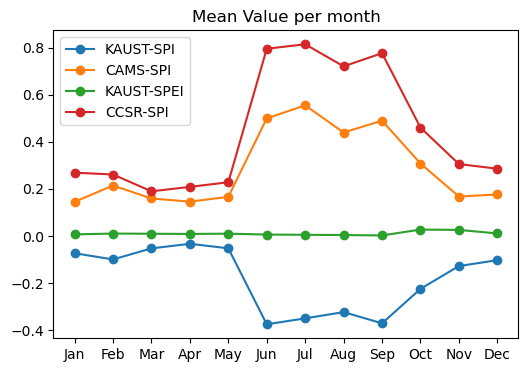

In [19]:
opi_mean = np.zeros(12)
kaust_mean = np.zeros(12)
cams_mean = np.zeros(12)
era5_mean = np.zeros(12)
custom_mean = np.zeros(12)
spei_mean = np.zeros(12)
months = np.arange(1, 13)
for month in months:
    data_month = data.where(data['T'].dt.month == month, drop=True)

    opi_mean[month-1] = data_month['CAMS_precip'].mean()
    kaust_mean[month-1] = data_month['KAUST_SPI'].mean()
    cams_mean[month-1] = data_month['CAMS_SPI'].mean()
    era5_mean[month-1] = data_month['KAUST_precip_anomalies'].mean()
    custom_mean[month-1] = data_month['custom_SPI'].mean()
    spei_mean[month-1] = data_month['KAUST_SPEI'].mean()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(6, 4))

# Plot the correlation values
#ax.plot(months, opi_mean, label='OPI', marker='o')
ax.plot(months, kaust_mean, label='KAUST-SPI', marker='o')
ax.plot(months, cams_mean, label='CAMS-SPI', marker='o')
#ax.plot(months, era5_mean, label='ERA5', marker='o')
ax.plot(months, spei_mean, label='KAUST-SPEI', marker='o')
ax.plot(months, custom_mean, label='CCSR-SPI', marker='o')

#ticks every month
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_xticks(months)
plt.legend()
plt.title('Mean Value per month')

Text(0.5, 1.0, 'Std per month')

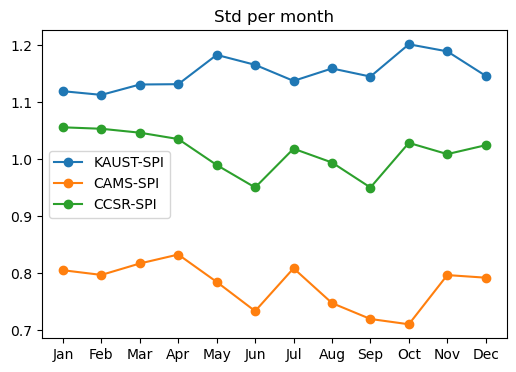

In [20]:
opi_mean = np.zeros(12)
kaust_mean = np.zeros(12)
cams_mean = np.zeros(12)
era5_mean = np.zeros(12)
custom_mean = np.zeros(12)
months = np.arange(1, 13)
for month in months:
    data_month = data.where(data['T'].dt.month == month, drop=True)

    opi_mean[month-1] = data_month['CAMS_precip'].std()
    kaust_mean[month-1] = data_month['KAUST_SPI'].std()
    cams_mean[month-1] = data_month['CAMS_SPI'].std()
    era5_mean[month-1] = data_month['KAUST_precip_anomalies'].std()
    custom_mean[month-1] = data_month['custom_SPI'].std()

# Create a figure and axis
fig, ax = plt.subplots(figsize=(6, 4))

# Plot the correlation values
#ax.plot(months, opi_mean, label='OPI', marker='o')
ax.plot(months, kaust_mean, label='KAUST-SPI', marker='o')
ax.plot(months, cams_mean, label='CAMS-SPI', marker='o')
#ax.plot(months, era5_mean, label='ERA5', marker='o')
ax.plot(months, custom_mean, label='CCSR-SPI', marker='o')

#ticks every month
ax.set_xticks(months)
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.title('Std per month')

Text(0.5, 0.98, 'Time Average')

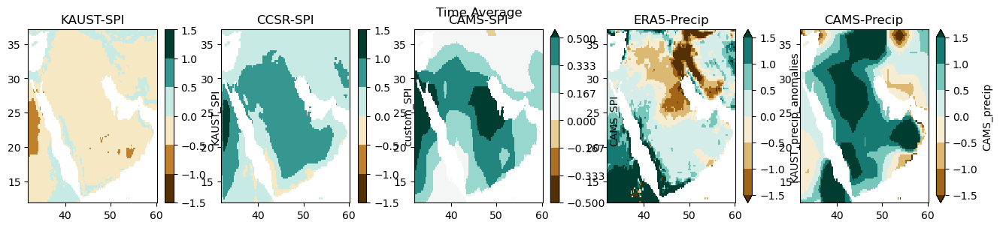

In [21]:

# Time average for KAUST and CAMS labeled variables
kaust_time_avg = data['KAUST_SPI'].mean(dim='T')
cams_time_avg = data['CAMS_SPI'].mean(dim='T')
opi_time_avg = data['CAMS_precip'].mean(dim='T')
era5_time_avg = data['KAUST_precip_anomalies'].mean(dim='T')
custom_time_avg = data['custom_SPI'].mean(dim='T')

# Create a figure with 3 subplots (one row, three columns)
fig, axs = plt.subplots(1, 5, figsize=(16, 3))

# Plot the time average for each variable
kaust_time_avg.plot(ax=axs[0], cmap='BrBG',levels=7,vmin=-1.5, vmax=1.5)
axs[0].set_title('KAUST-SPI')

custom_time_avg.plot(ax=axs[1], cmap='BrBG',levels=7,vmin=-1.5, vmax=1.5)
axs[1].set_title('CCSR-SPI')

cams_time_avg.plot(ax=axs[2], cmap='BrBG',levels=7,vmin=-0.5, vmax=0.5)
axs[2].set_title('CAMS-SPI')

era5_time_avg.plot(ax=axs[3], cmap='BrBG',levels=7,vmin=-1.5, vmax=1.5)
axs[3].set_title('ERA5-Precip')

opi_time_avg.plot(ax=axs[4], cmap='BrBG',levels=7,vmin=-1.5, vmax=1.5)
axs[4].set_title('CAMS-Precip')


#rempve X and Y labels
for ax in axs.flat:
    ax.set(xlabel='', ylabel='')

plt.suptitle('Time Average')

Text(0.5, 0.98, 'Time Stdev')

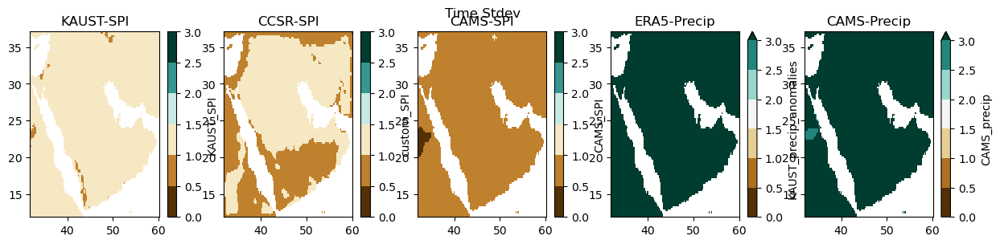

In [22]:

# Time average for KAUST and CAMS labeled variables
kaust_time_avg = data['KAUST_SPI'].std(dim='T')
cams_time_avg = data['CAMS_SPI'].std(dim='T')
opi_time_avg = data['CAMS_precip'].std(dim='T')
era5_time_avg = data['KAUST_precip_anomalies'].std(dim='T')
custom_time_avg = data['custom_SPI'].std(dim='T')

# Create a figure with 3 subplots (one row, three columns)
fig, axs = plt.subplots(1, 5, figsize=(15, 3))

# Plot the time average for each variable
kaust_time_avg.plot(ax=axs[0], cmap='BrBG',levels=7,vmin=0, vmax=3)
axs[0].set_title('KAUST-SPI')

custom_time_avg.plot(ax=axs[1], cmap='BrBG',levels=7,vmin=0, vmax=3)
axs[1].set_title('CCSR-SPI')

cams_time_avg.plot(ax=axs[2], cmap='BrBG',levels=7,vmin=0, vmax=3)
axs[2].set_title('CAMS-SPI')

era5_time_avg.plot(ax=axs[3], cmap='BrBG',levels=7,vmin=0, vmax=3)
axs[3].set_title('ERA5-Precip')

opi_time_avg.plot(ax=axs[4], cmap='BrBG',levels=7,vmin=0, vmax=3)
axs[4].set_title('CAMS-Precip')


#rempve X and Y labels
for ax in axs.flat:
    ax.set(xlabel='', ylabel='')

plt.suptitle('Time Stdev')

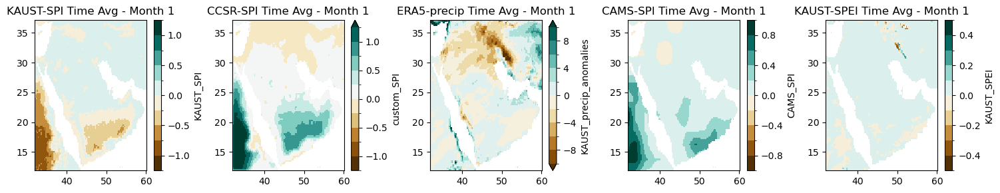

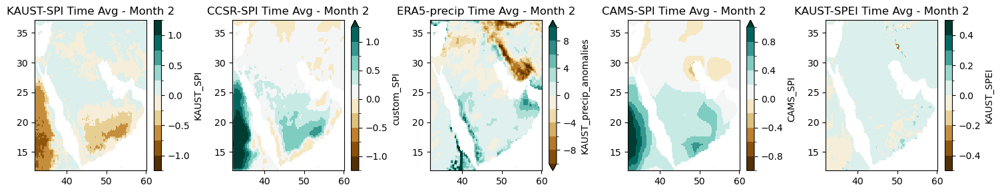

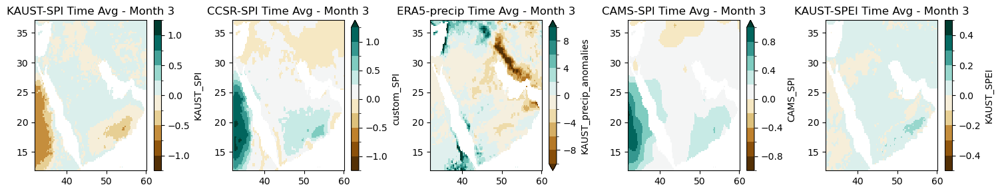

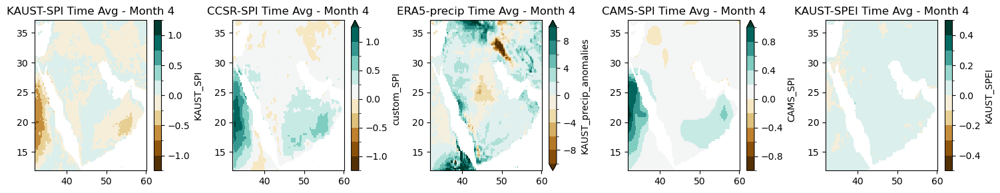

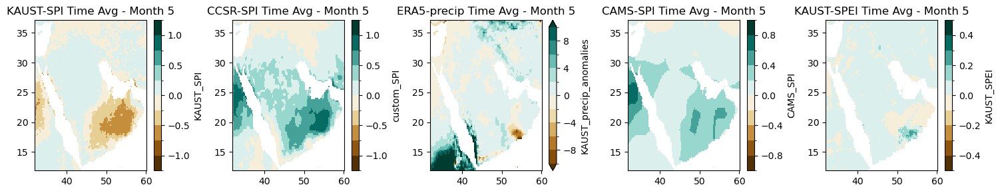

...

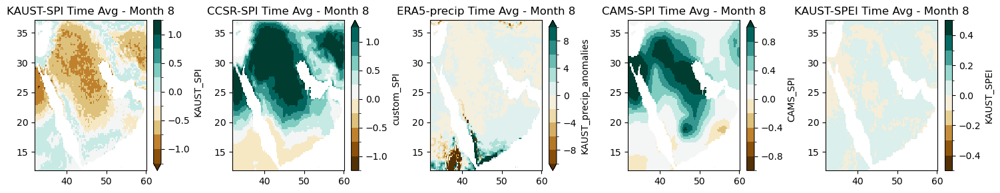

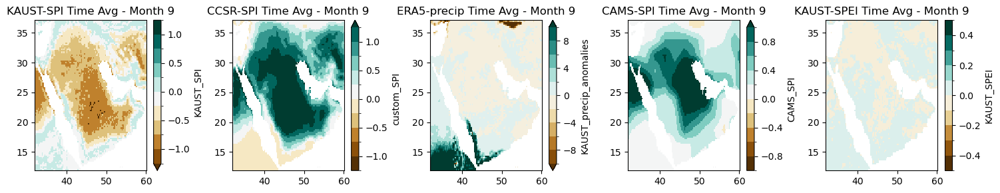

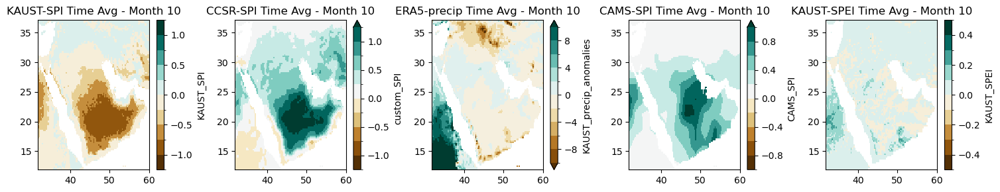

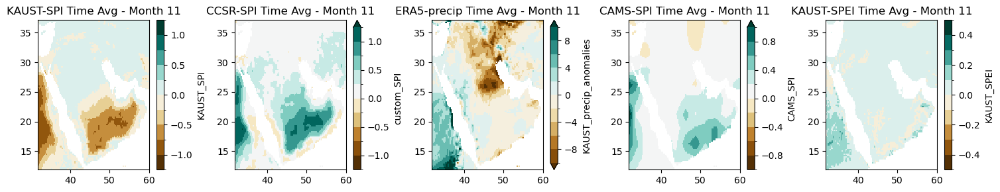

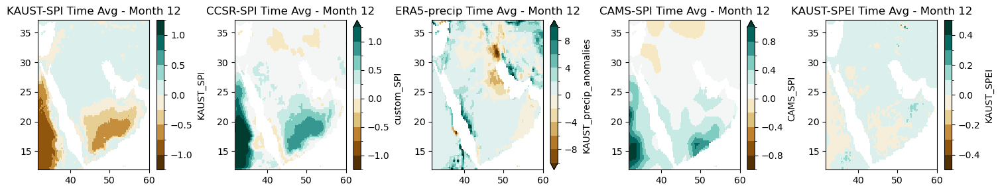

In [23]:

# Loop over each month
for month in range(1, 13):
    if data['T'].dtype != 'datetime64[ns]':
        data['T'] = pd.to_datetime(data['T'].values, format='%m-%Y')
    # Select the data for the specific month
    data_month = data.where(data['T'].dt.month == month, drop=True)
    
    # Compute the time averages for each variable over the time dimension (T)
    kaust_time_avg = data_month['KAUST_SPI'].mean(dim='T')
    cams_time_avg = data_month['CAMS_SPI'].mean(dim='T')
    opi_time_avg = data_month['CAMS_precip'].mean(dim='T')
    era5_time_avg = data_month['KAUST_precip_anomalies'].mean(dim='T')
    custom_time_avg = data_month['custom_SPI'].mean(dim='T')
    spei_time_avg = data_month['KAUST_SPEI'].mean(dim='T')

    # #label values below -0.5 as 1, below -2 as 2, rest as 0
    # kaust_time_avg = xr.where(kaust_time_avg < -2, 2, xr.where(kaust_time_avg < -0.5, 1, 0))
    # cams_time_avg = xr.where(cams_time_avg < -2, 2, xr.where(cams_time_avg < -0.5, 1, 0))
    
    # Plot the time averages for each month in the respective subplot
    row, col = (month-1)//4, (month-1)%4
    # Create a figure with 3 subplots (one row, three columns for each month)
    fig, axs_month = plt.subplots(1, 5, figsize=(15, 3))
    # Plot KAUST
    kaust_time_avg.plot(ax=axs_month[0], cmap='BrBG',levels=11, vmin=-1.25, vmax=1.25)
    axs_month[0].set_title(f'KAUST-SPI Time Avg - Month {month}')

    #Plot Custom
    custom_time_avg.plot(ax=axs_month[1], cmap='BrBG',levels=11, vmin=-1.25, vmax=1.25)
    axs_month[1].set_title(f'CCSR-SPI Time Avg - Month {month}')
    # Plot ERA5
    era5_time_avg.plot(ax=axs_month[2], cmap='BrBG', vmin=-10, vmax=10, levels=11)
    axs_month[2].set_title(f'ERA5-precip Time Avg - Month {month}')
    # Plot CAMS
    cams_time_avg.plot(ax=axs_month[3], cmap='BrBG', levels=11, vmin=-1., vmax=1.)
    axs_month[3].set_title(f'CAMS-SPI Time Avg - Month {month}')
    # Plot OPI
    spei_time_avg.plot(ax=axs_month[4], cmap='BrBG', vmin=-0.5, vmax=0.5, levels=11)
    axs_month[4].set_title(f'KAUST-SPEI Time Avg - Month {month}')

    #remove X and Y labels
    for ax in axs_month.flat:
        ax.set(xlabel='', ylabel='')
    plt.tight_layout()
    plt.show()

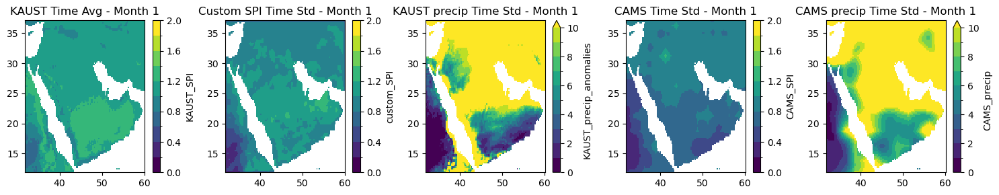

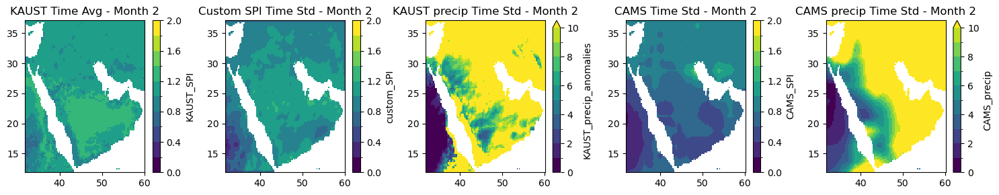

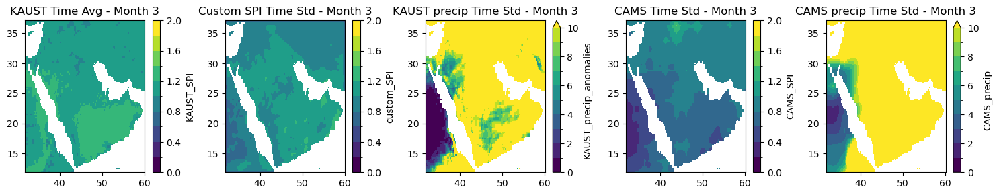

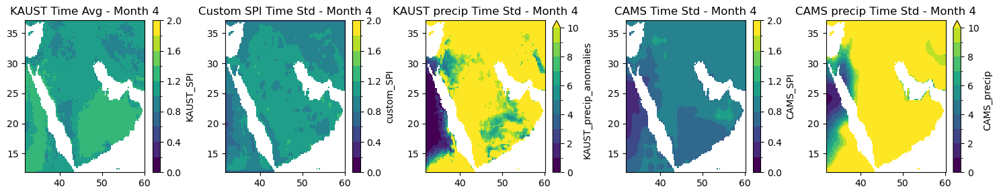

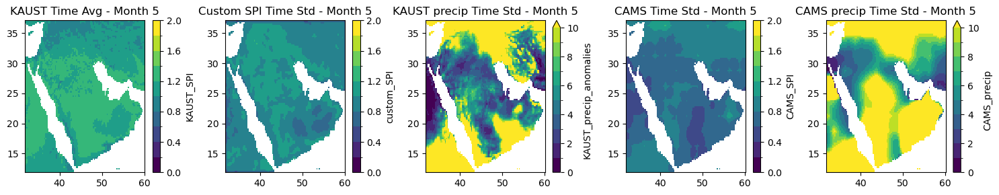

...

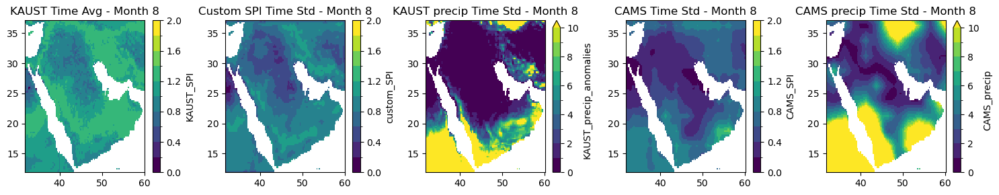

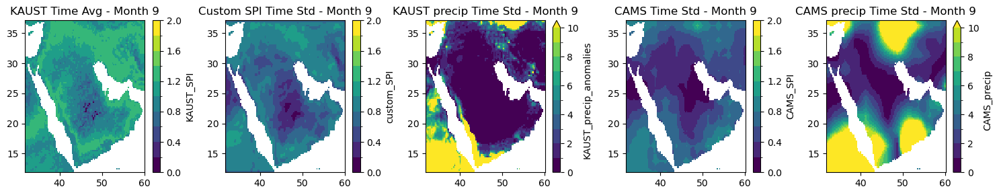

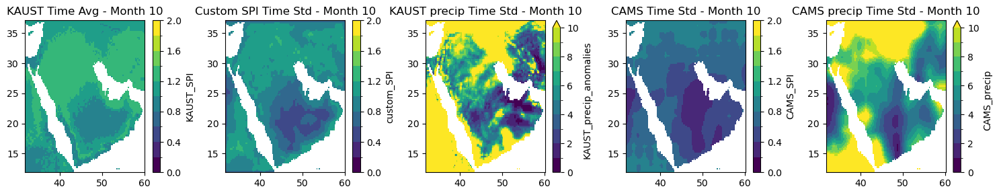

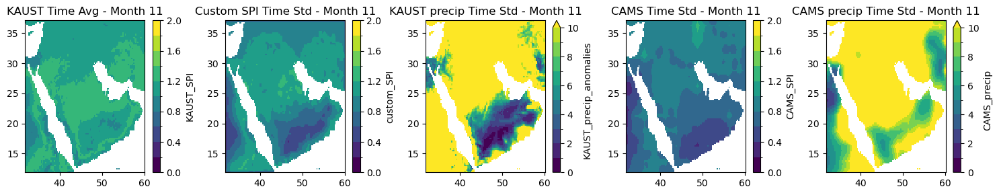

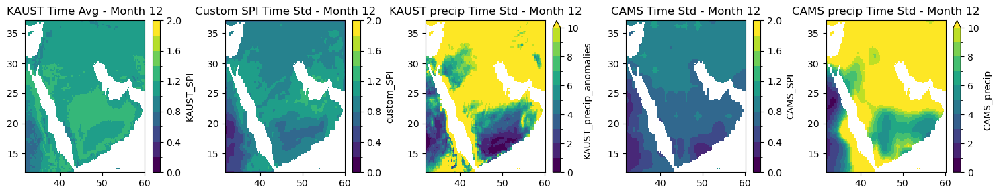

In [24]:

# Loop over each month
for month in range(1, 13):
    if data['T'].dtype != 'datetime64[ns]':
        data['T'] = pd.to_datetime(data['T'].values, format='%m-%Y')
    # Select the data for the specific month
    data_month = data.where(data['T'].dt.month == month, drop=True)
    
    # Compute the time averages for each variable over the time dimension (T)
    kaust_time_avg = data_month['KAUST_SPI'].std(dim='T')
    cams_time_avg = data_month['CAMS_SPI'].std(dim='T')
    opi_time_avg = data_month['CAMS_precip'].std(dim='T')
    era5_time_avg = data_month['KAUST_precip_anomalies'].std(dim='T')
    custom_time_avg = data_month['custom_SPI'].std(dim='T')

    # #label values below -0.5 as 1, below -2 as 2, rest as 0
    # kaust_time_avg = xr.where(kaust_time_avg < -2, 2, xr.where(kaust_time_avg < -0.5, 1, 0))
    # cams_time_avg = xr.where(cams_time_avg < -2, 2, xr.where(cams_time_avg < -0.5, 1, 0))
    
    # Plot the time averages for each month in the respective subplot
    row, col = (month-1)//4, (month-1)%4
    # Create a figure with 3 subplots (one row, three columns for each month)
    fig, axs_month = plt.subplots(1, 5, figsize=(15, 3))
    # Plot KAUST
    kaust_time_avg.plot(ax=axs_month[0],levels=11, vmin=0, vmax=2)
    axs_month[0].set_title(f'KAUST Time Avg - Month {month}')

    #Plot Custom
    custom_time_avg.plot(ax=axs_month[1],levels=11, vmin=0, vmax=2)
    axs_month[1].set_title(f'Custom SPI Time Std - Month {month}')
    # Plot ERA5
    era5_time_avg.plot(ax=axs_month[2], vmin=0, vmax=10, levels=11)
    axs_month[2].set_title(f'KAUST precip Time Std - Month {month}')
    # Plot CAMS
    cams_time_avg.plot(ax=axs_month[3], levels=11, vmin=0, vmax=2)
    axs_month[3].set_title(f'CAMS Time Std - Month {month}')
    # Plot OPI
    opi_time_avg.plot(ax=axs_month[4], vmin=0, vmax=10, levels=11)
    axs_month[4].set_title(f'CAMS precip Time Std - Month {month}')

    #remove X and Y labels
    for ax in axs_month.flat:
        ax.set(xlabel='', ylabel='')
    plt.tight_layout()
    plt.show()

# Density

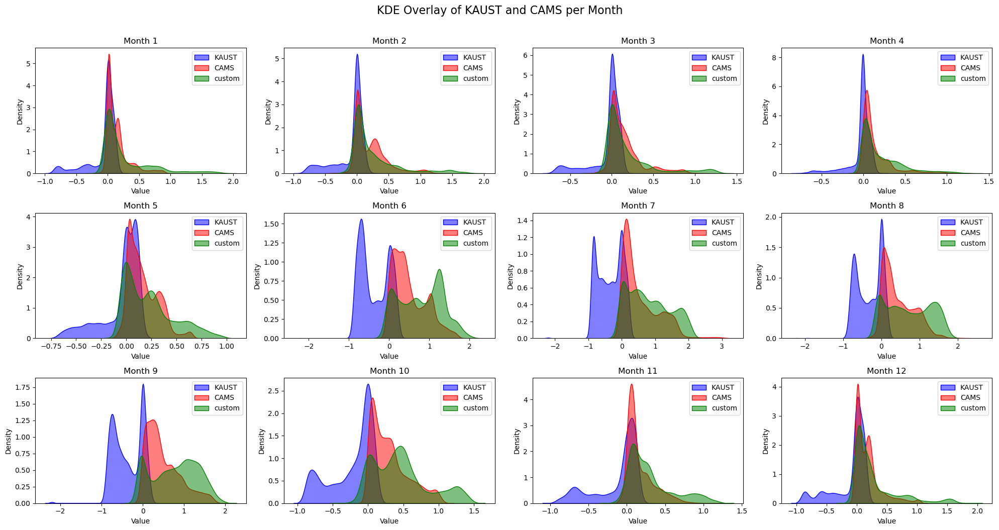

In [25]:
import seaborn as sns
opi_vals = np.zeros((12, data.X.size * data.Y.size))  # 12 months
kaust_vals = np.zeros((12, data.X.size * data.Y.size))
cams_vals = np.zeros((12, data.X.size * data.Y.size))
era5_vals = np.zeros((12, data.X.size * data.Y.size))
custom_vals = np.zeros((12, data.X.size * data.Y.size))
months = np.arange(1, 13)

# Calculate the mean values for each month
for month in months:
    data_month = data.where(data['T'].dt.month == month, drop=True)

    opi_vals[month-1] = data_month['CAMS_precip'].mean(dim='T').values.flatten()
    kaust_vals[month-1] = data_month['KAUST_SPI'].mean(dim='T').values.flatten()
    cams_vals[month-1] = data_month['CAMS_SPI'].mean(dim='T').values.flatten()
    era5_vals[month-1] = data_month['KAUST_precip_anomalies'].mean(dim='T').values.flatten()
    custom_vals[month-1] = data_month['custom_SPI'].mean(dim='T').values.flatten()

# Create a figure with subplots for each month
fig, axs = plt.subplots(3, 4, figsize=(20, 10), sharey=False, sharex=False)

# Overlay KDEs for each month
for month in months:
    ax = axs[(month - 1) // 4, (month - 1) % 4]  # Get the correct subplot
    #sns.kdeplot(opi_vals[month-1], ax=ax, label='OPI', color='blue', fill=True, alpha=0.5)
    sns.kdeplot(kaust_vals[month-1], ax=ax, label='KAUST', color='blue', fill=True, alpha=0.5)
    sns.kdeplot(cams_vals[month-1], ax=ax, label='CAMS', color='red', fill=True, alpha=0.5)
    sns.kdeplot(custom_vals[month-1], ax=ax, label='custom', color='green', fill=True, alpha=0.5)


    ax.set_title(f'Month {month}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Density')
    ax.legend()

plt.tight_layout()
plt.suptitle('KDE Overlay of KAUST and CAMS per Month', fontsize=16, y=1.05)
plt.show()

# Trend

In [26]:
# Prepare an array to store the trends for all grid points
months = np.arange(1, 13)
opi_trend = np.zeros((months.size, data.Y.size, data.X.size))
kaust_trend = np.zeros((months.size, data.Y.size, data.X.size))
cams_trend = np.zeros((months.size, data.Y.size, data.X.size))
era5_trend = np.zeros((months.size, data.Y.size, data.X.size))
custom_trend = np.zeros((months.size, data.Y.size, data.X.size))

data_trend = data.sel(T=slice('01-1979', None))

# Loop over each month
for month in months:
    print(month)
    data_month = data_trend.where(data['T'].dt.month == month, drop=True)
    
    # Loop over all grid points to compute the trend
    for i in range(data_month.Y.size):
        for j in range(data_month.X.size):
            # Extract time series for each variable at this grid point
            opi_series = data_month['CAMS_precip'][:, i, j].values
            kaust_series = data_month['KAUST_SPI'][:, i, j].values
            cams_series = data_month['CAMS_SPI'][:, i, j].values
            era5_series = data_month['KAUST_precip_anomalies'][:, i, j].values
            custom_series = data_month['custom_SPI'][:, i, j].values
            
            # Compute the time index (e.g., 0, 1, 2, ..., N-1)
            time_index = np.arange(len(opi_series))

            # Check if there are enough valid data points to compute trend
            if not np.isnan(opi_series).any() and len(opi_series) > 1:
                # Fit a linear polynomial to the OPI time series
                trend_coeff = np.polyfit(time_index[~np.isnan(opi_series)], opi_series[~np.isnan(opi_series)], 1)
                opi_trend[month-1, i, j] = trend_coeff[0]  # Store the slope

            if not np.isnan(kaust_series).any() and len(kaust_series) > 1:
                trend_coeff = np.polyfit(time_index[~np.isnan(kaust_series)], kaust_series[~np.isnan(kaust_series)], 1)
                kaust_trend[month-1, i, j] = trend_coeff[0]  # Store the slope

            if not np.isnan(cams_series).any() and len(cams_series) > 1:
                trend_coeff = np.polyfit(time_index[~np.isnan(cams_series)], cams_series[~np.isnan(cams_series)], 1)
                cams_trend[month-1, i, j] = trend_coeff[0]  # Store the slope

            if not np.isnan(era5_series).any() and len(era5_series) > 1:
                trend_coeff = np.polyfit(time_index[~np.isnan(era5_series)], era5_series[~np.isnan(era5_series)], 1)
                era5_trend[month-1, i, j] = trend_coeff[0]

            if not np.isnan(custom_series).any() and len(custom_series) > 1:
                trend_coeff = np.polyfit(time_index[~np.isnan(custom_series)], custom_series[~np.isnan(custom_series)], 1)
                custom_trend[month-1, i, j] = trend_coeff[0]
                

# Convert trends to xarray DataArray
opi_trend_da = xr.DataArray(opi_trend, coords=[months, data.Y, data.X], dims=["T", "Y", "X"], name="OPI Trend")
kaust_trend_da = xr.DataArray(kaust_trend, coords=[months, data.Y, data.X], dims=["T", "Y", "X"], name="KAUST Trend")
cams_trend_da = xr.DataArray(cams_trend, coords=[months, data.Y, data.X], dims=["T", "Y", "X"], name="CAMS Trend")
era5_trend_da = xr.DataArray(era5_trend, coords=[months, data.Y, data.X], dims=["T", "Y", "X"], name="ERA5 Trend")
custom_trend_da = xr.DataArray(custom_trend, coords=[months, data.Y, data.X], dims=["T", "Y", "X"], name="Custom SPI Trend")

# Create a dataset to hold all trends
trends_ds = xr.Dataset({
    'OPI_Trend': opi_trend_da,
    'KAUST_Trend': kaust_trend_da,
    'CAMS_Trend': cams_trend_da,
    'ERA5_Trend': era5_trend_da,
    'Custom_Trend': custom_trend_da
})


1
2
3
4
5
6
7
8
9
10
11
12


Text(0.5, 0.98, 'CAMS SPI Trends')

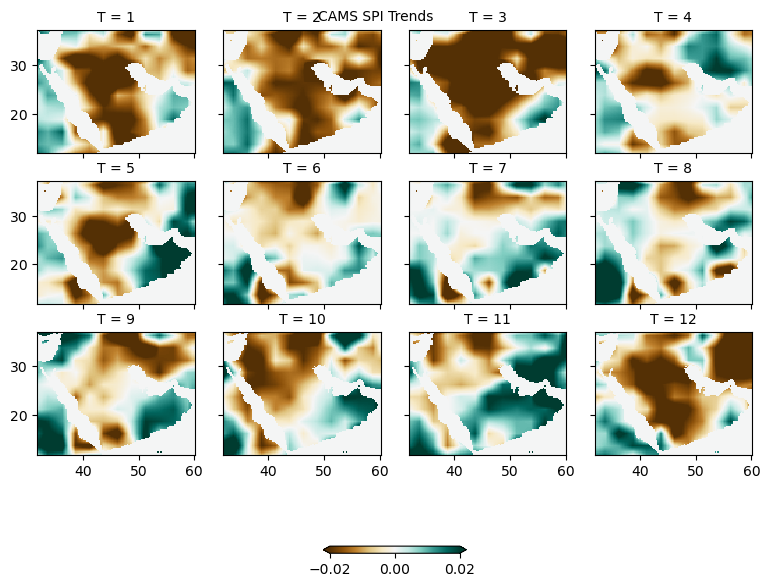

In [27]:
cams_trend_da.plot(col='T', col_wrap=4, cmap='BrBG', vmin=-0.02, vmax=0.02, figsize=(8, 7),cbar_kwargs={'shrink': 0.2, 'label': 'Trend', 'orientation': 'horizontal'})
#remove X and Y labels
for ax in plt.gcf().axes:
    ax.set(xlabel='', ylabel='')
plt.suptitle('CAMS SPI Trends', fontsize=10)

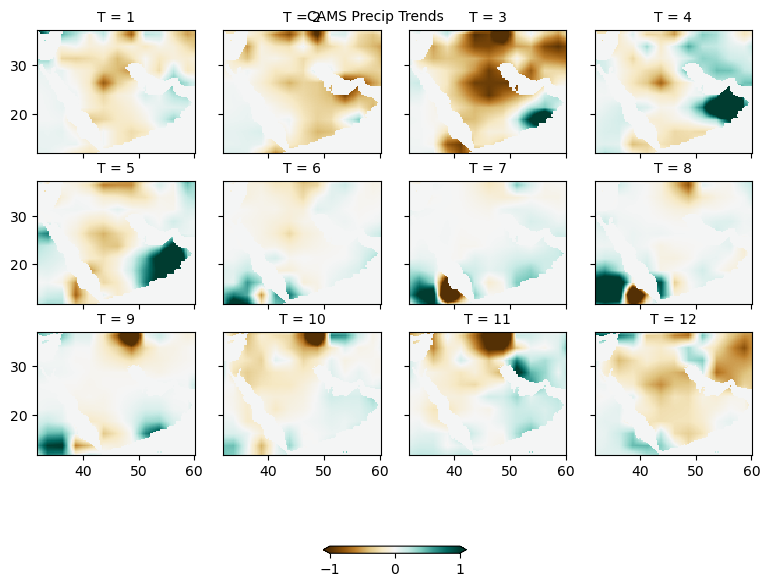

In [28]:
opi_trend_da.plot(col='T', col_wrap=4, cmap='BrBG', vmin=-1, vmax=1, figsize=(8, 7),cbar_kwargs={'label': 'Trend', 'orientation': 'horizontal','shrink': 0.2})
plt.suptitle('CAMS Precip Trends', fontsize=10)
#remove X and Y labels
for ax in plt.gcf().axes:
    ax.set(xlabel='', ylabel='')
#plt.tight_layout()


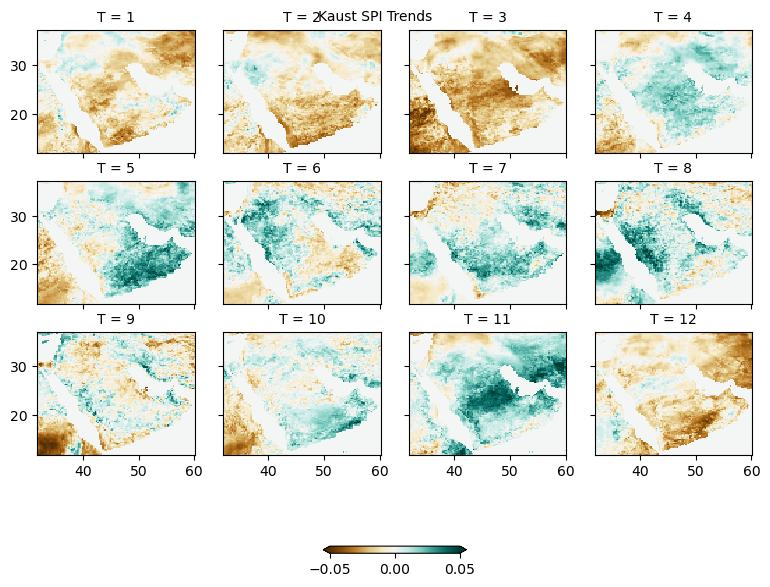

In [29]:
kaust_trend_da.plot(col='T', col_wrap=4, cmap='BrBG', vmin=-0.05, vmax=0.05, figsize=(8, 7),cbar_kwargs={'label': 'Trend', 'orientation': 'horizontal','shrink': 0.2})
plt.suptitle('Kaust SPI Trends', fontsize=10)
#remove X and Y labels
for ax in plt.gcf().axes:
    ax.set(xlabel='', ylabel='')


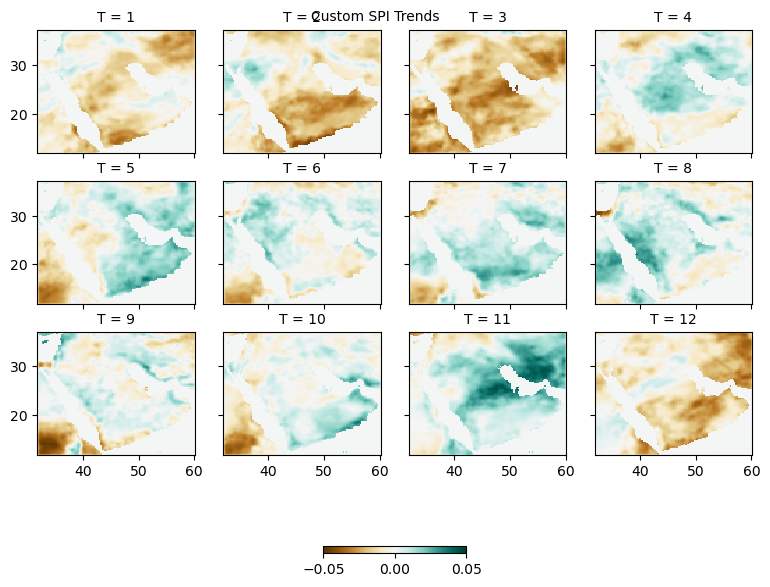

In [30]:
custom_trend_da.plot(col='T', col_wrap=4, cmap='BrBG', vmin=-0.05, vmax=0.05, figsize=(8, 7),cbar_kwargs={'label': 'Trend', 'orientation': 'horizontal','shrink': 0.2})
plt.suptitle('Custom SPI Trends', fontsize=10)
#remove X and Y labels
for ax in plt.gcf().axes:
    ax.set(xlabel='', ylabel='')

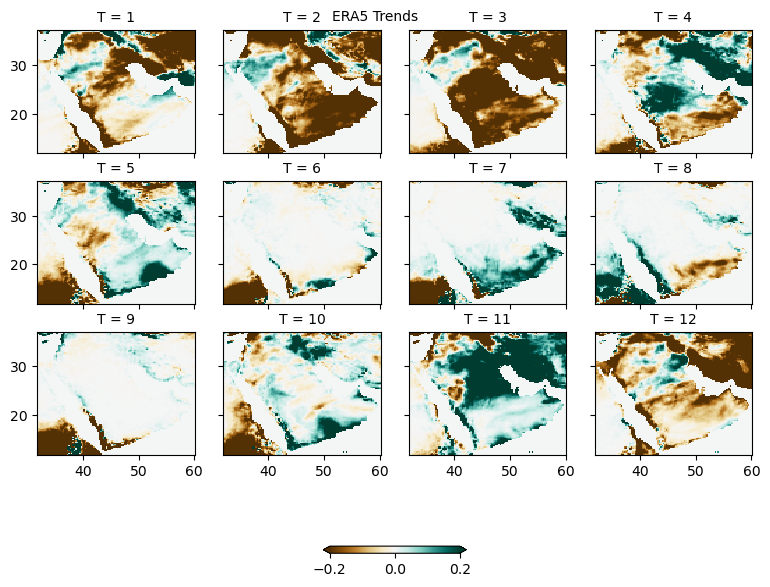

In [31]:
era5_trend_da.plot(col='T', col_wrap=4, vmin=-0.2, vmax=0.2, figsize=(8,7), cmap='BrBG',
                   cbar_kwargs={'shrink': 0.2, 'label': 'Trend', 'orientation': 'horizontal'})
plt.suptitle('ERA5 Trends', fontsize=10)
#remove X and Y labels
for ax in plt.gcf().axes:
    ax.set(xlabel='', ylabel='')

Text(0.5, 1.0, 'Mean Trend per month')

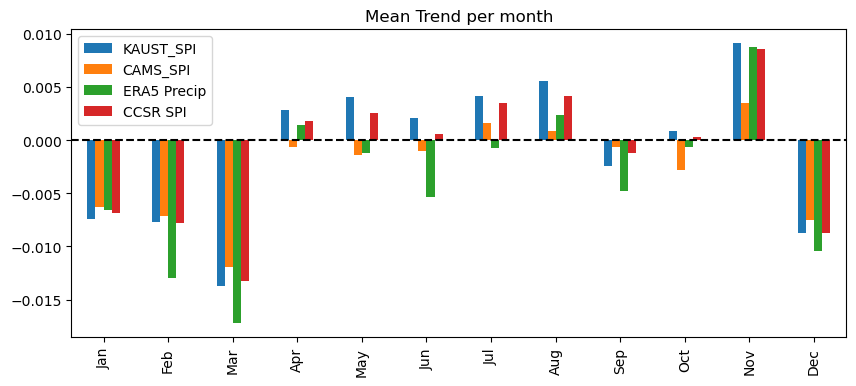

In [32]:
kaust_trend_mean = kaust_trend_da.mean(dim=['Y', 'X'])
cams_trend_mean = cams_trend_da.mean(dim=['Y', 'X'])
opi_trend_mean = opi_trend_da.mean(dim=['Y', 'X'])
era5_trend_mean = era5_trend_da.mean(dim=['Y', 'X'])/10
custom_trend_mean = custom_trend_da.mean(dim=['Y', 'X'])

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 4))


trend_df = pd.DataFrame({'KAUST_SPI': kaust_trend_mean, 'CAMS_SPI': cams_trend_mean, 'ERA5 Precip': era5_trend_mean, 'CCSR SPI': custom_trend_mean})
trend_df.plot(kind='bar', ax=ax)
#horizontal line at 0
#map x ticks to months strings
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.axhline(y=0, color='black', linestyle='--')
plt.legend()
plt.title('Mean Trend per month')

# Classification

In [33]:
#print the median 10th 90th percentile for each variable
print('Quantiles overall (10% - 50% - 90%)')
print('KAUST SPI: ',data['KAUST_SPI'].quantile([0.1, 0.5, 0.9]).values)
print('CAMS SPI: ',data['CAMS_SPI'].quantile([0.1, 0.5, 0.9]).values)
print('OPI Precip: ',data['CAMS_precip'].quantile([0.1, 0.5, 0.9]).values)
print('ERA5 Precip: ',data['KAUST_precip_anomalies'].quantile([0.1, 0.5, 0.9]).values)
print('CCSR SPI: ',data['custom_SPI'].quantile([0.1, 0.5, 0.9]).values)
print('KAUST SPEI: ',data['KAUST_SPEI'].quantile([0.1, 0.5, 0.9]).values)



Quantiles overall (10% - 50% - 90%)
KAUST SPI:  [-1.52142143 -0.05372758  1.21072069]
CAMS SPI:  [-0.72103176  0.28601807  1.31344534]
OPI Precip:  [-10.63152275  -0.91086239  14.77572594]
ERA5 Precip:  [-11.79504213  -0.39863586  12.62484245]
CCSR SPI:  [-0.80387961  0.39447097  1.69596136]
KAUST SPEI:  [-1.25746378  0.          1.30464166]


In [34]:
#label values below -0.5 as 1, below -2 as 2, rest as 0 keep nans
kaust_labeled = xr.where(data['KAUST_SPI'] < -1.5, 2, xr.where(data['KAUST_SPI'] < -0.5, 1, xr.where(np.isnan(data['KAUST_SPI']), np.nan, 0)))
cams_labeled = xr.where(data['CAMS_SPI'] < -1.5, 2, xr.where(data['CAMS_SPI'] < -0.5, 1, xr.where(np.isnan(data['CAMS_SPI']), np.nan, 0)))
custom_labeled = xr.where(data['custom_SPI'] < -1.5, 2, xr.where(data['custom_SPI'] < -0.5, 1, xr.where(np.isnan(data['custom_SPI']), np.nan, 0)))
data_labeled = xr.Dataset({'KAUST': kaust_labeled, 'CAMS': cams_labeled, 'Custom': custom_labeled})

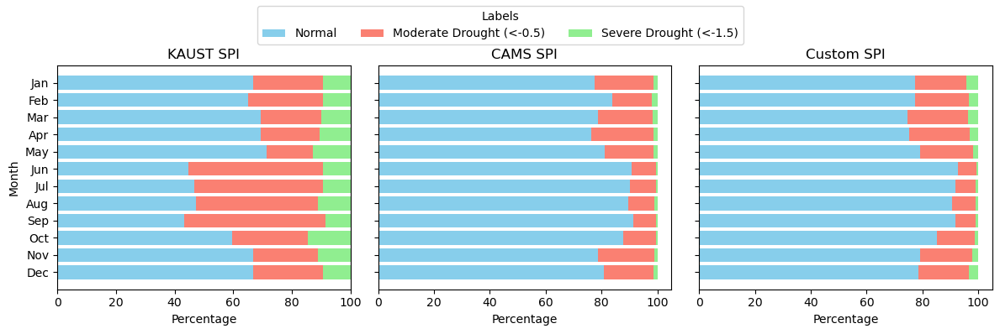

In [35]:
# Initialize lists to store results
months = np.arange(1, 13)  # Array of months from 1 to 12

# Create a figure with two subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

# Loop over the two variables 'KAUST' and 'CAMS' and generate the plots
for idx, var in enumerate(['KAUST', 'CAMS','Custom']):
    percentage_0 = []
    percentage_1 = []
    percentage_2 = []

    data_var = data_labeled[var]
    
    # Loop through each month and calculate label distribution
    for month in months:
        if data_var['T'].dtype != 'datetime64[ns]':
            data_var['T'] = pd.to_datetime(data_var['T'].values, format='%m-%Y')
        # Select the data for the specific month
        data_month = data_var.where(data_var['T'].dt.month == month, drop=True)
        flattened_data = data_month.values.flatten()
        flattened_data = flattened_data[~np.isnan(flattened_data)]
        
        # Count occurrences of each label
        total = len(flattened_data)
        count_0 = np.sum(flattened_data == 0)
        count_1 = np.sum(flattened_data == 1)
        count_2 = np.sum(flattened_data == 2)
        
        # Calculate percentage
        percent_0 = (count_0 / total) * 100 if total > 0 else 0
        percent_1 = (count_1 / total) * 100 if total > 0 else 0
        percent_2 = (count_2 / total) * 100 if total > 0 else 0
        
        # Store the results
        percentage_0.append(percent_0)
        percentage_1.append(percent_1)
        percentage_2.append(percent_2)

    # Create a DataFrame for easier plotting
    df = pd.DataFrame({
        'Month': months,
        '0': percentage_0,
        '1': percentage_1,
        '2': percentage_2
    })

    #normalize percentages
    df['0'] = (df['0'] / (df['0'] + df['1'] + df['2'])) * 100
    df['1'] = df['1'] / (df['0'] + df['1'] + df['2']) * 100
    df['2'] = df['2'] / (df['0'] + df['1'] + df['2']) * 100

    # Plotting the horizontal stacked bar chart
    ax = axes[idx]
    
    # Create stacked bar chart
    ax.barh(df['Month'], df['0'], color='skyblue', label='0')
    ax.barh(df['Month'], df['1'], left=df['0'], color='salmon', label='1')
    ax.barh(df['Month'], df['2'], left=df['0'] + df['1'], color='lightgreen', label='2')

    # Set labels and title
    ax.set_xlabel('Percentage')
    ax.set_ylabel('Month' if idx == 0 else '')  # Only set y-label for the first subplot

# Add a common legend for both plots
handles, labels = ax.get_legend_handles_labels()
#change label legend to string
labels = ['Normal', 'Moderate Drought (<-0.5)', 'Severe Drought (<-1.5)']
fig.legend(handles, labels, loc='upper center', title='Labels', ncol=3)
#tick every month
ax.set_yticks(months)
#y axis months string
axes[0].set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
# x-axis 0-100
axes[0].set_xlim(0, 100)
#reverse y axis
axes[0].invert_yaxis()
#set titles
axes[0].set_title('KAUST SPI')
axes[1].set_title('CAMS SPI')
axes[2].set_title('Custom SPI')
# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.9])


# Show plot
plt.show()

In [36]:
#find dates where sum of label 2 is greatest
dates_df = data_labeled.sum(dim=['X', 'Y']).sortby('KAUST', ascending=False).to_dataframe()
dates_df.head(10)


,KAUST,CAMS,Custom
T,,,
2008-03-01,14482.0,8464.0,11553.0
1956-05-01,12782.0,0.0,7361.0
2023-07-01,12622.0,1210.0,2199.0
1956-11-01,12443.0,0.0,7758.0
2023-09-01,12368.0,887.0,2060.0
1983-10-01,11396.0,2132.0,4083.0
2011-12-01,11319.0,6333.0,8751.0
2021-03-01,10980.0,5700.0,8347.0
1998-12-01,10839.0,5507.0,8180.0


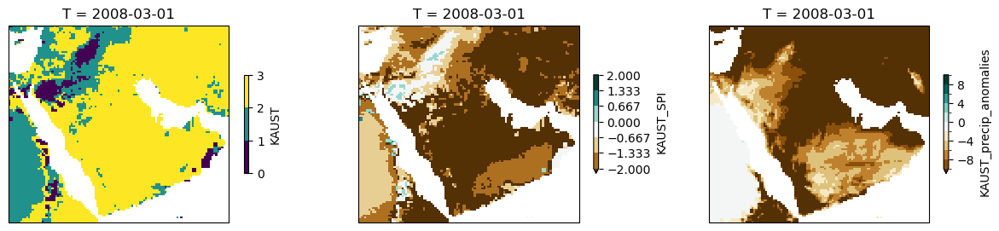

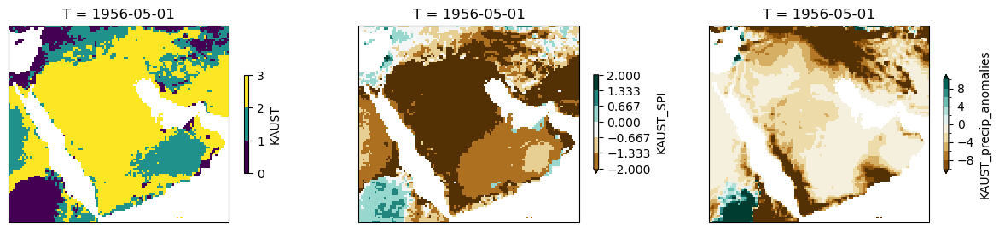

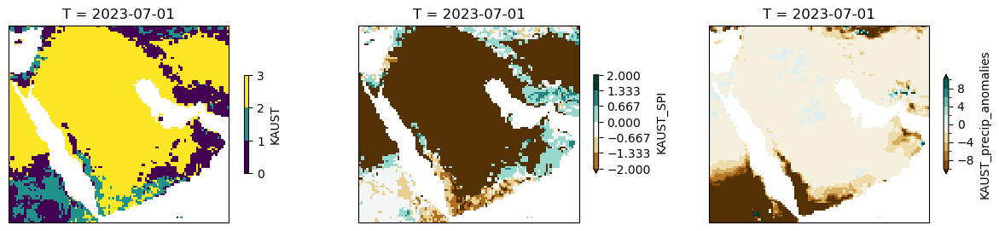

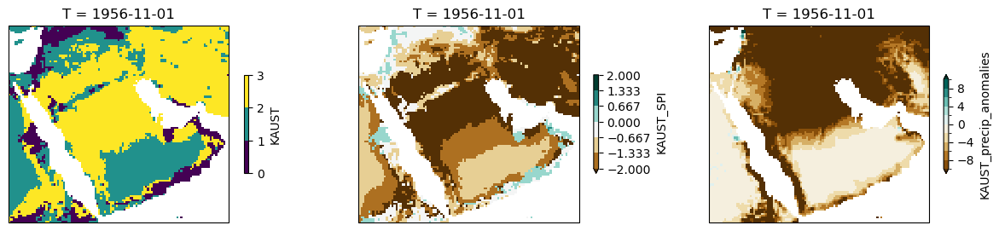

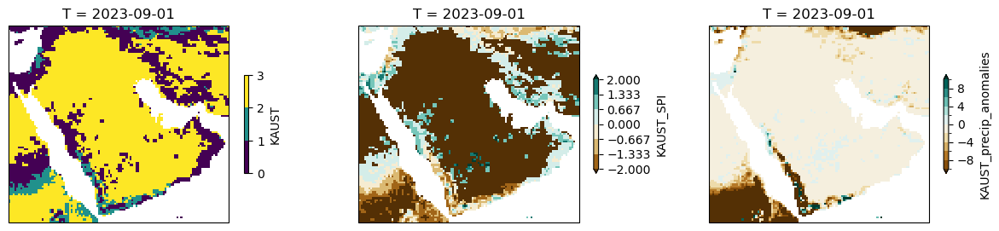

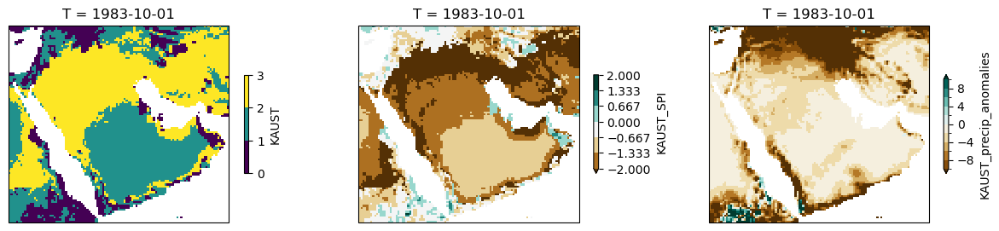

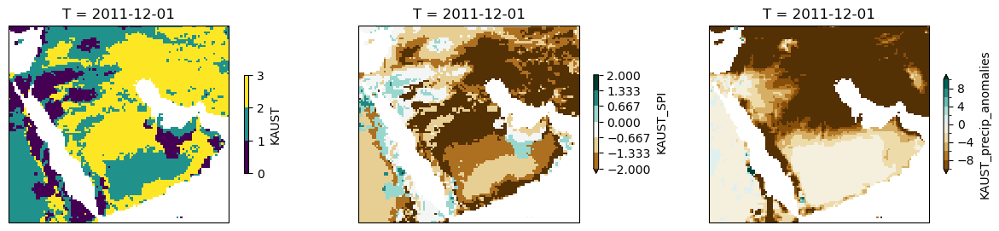

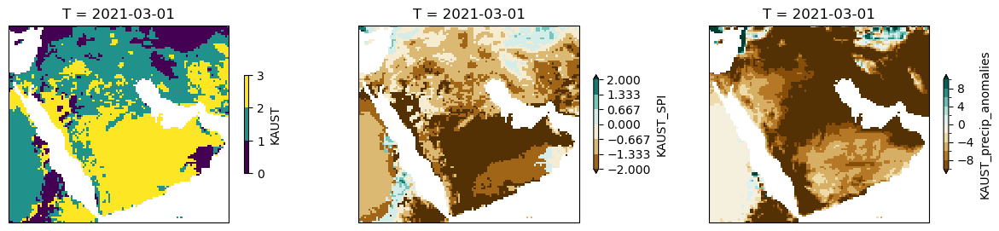

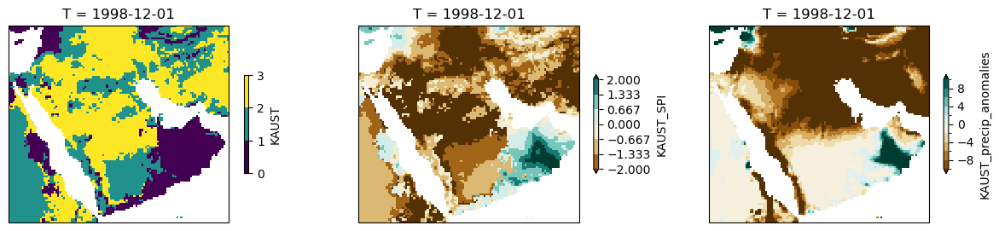

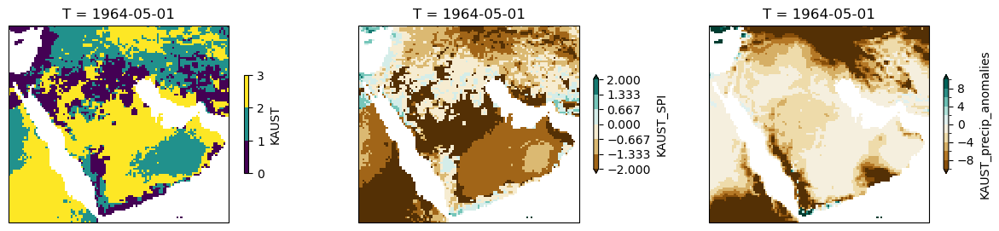

In [37]:
dates = dates_df.index[:10]
for date in dates:
    fig, ax = plt.subplots(1,3, figsize=(15, 3), subplot_kw={'projection': ccrs.PlateCarree()})

    data_labeled['KAUST'].sel(T=date).plot(levels=4,vmax=3, ax=ax[0],cbar_kwargs={'shrink': 0.5})
    data['KAUST_SPI'].sel(T=date).plot(levels=7,vmax=2, vmin=-2, ax=ax[1],cmap='BrBG',cbar_kwargs={'shrink': 0.5})
    data['KAUST_precip_anomalies'].sel(T=date).plot(levels=11,vmax=10, vmin=-10, ax=ax[2],cmap='BrBG',cbar_kwargs={'shrink': 0.5})
    plt.show()


## Per month

In [38]:
dates_df['month'] = dates_df.index.month
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
          'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

top_dates_df = pd.DataFrame(columns=['Top 1', 'Top 2', 'Top 3', 'Top 4', 'Top 5'], index=months)

for month_num, month_name in enumerate(months, 1):
    dates_df_month = dates_df[dates_df['month'] == month_num]
    top_dates = dates_df_month.head(5).index.strftime('%Y-%m-%d')  # Format the index as a string
    top_dates_df.iloc[months.index(month_name), :len(top_dates)] = top_dates  # Use .iloc for positional indexing

top_dates_df

,Top 1,Top 2,Top 3,Top 4,Top 5
Jan,1987-01-01,2021-01-01,1954-01-01,2018-01-01,1989-01-01
Feb,1997-02-01,1955-02-01,1962-02-01,2000-02-01,1977-02-01
Mar,2008-03-01,2021-03-01,2022-03-01,2000-03-01,1973-03-01
Apr,1958-04-01,2015-04-01,1999-04-01,2000-04-01,2001-04-01
May,1956-05-01,1964-05-01,1965-05-01,2022-05-01,1999-05-01
Jun,1970-06-01,1967-06-01,2021-06-01,1990-06-01,2017-06-01
Jul,2023-07-01,1965-07-01,2009-07-01,1991-07-01,1966-07-01
Aug,1967-08-01,1984-08-01,1991-08-01,1978-08-01,2023-08-01
Sep,2023-09-01,1990-09-01,1961-09-01,2003-09-01,1962-09-01
Oct,1983-10-01,1956-10-01,1975-10-01,2020-10-01,1960-10-01


1


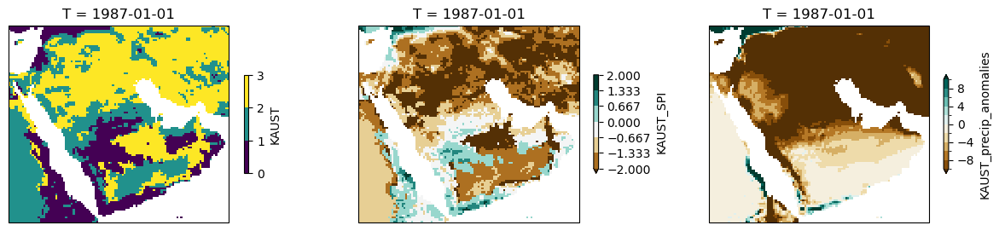

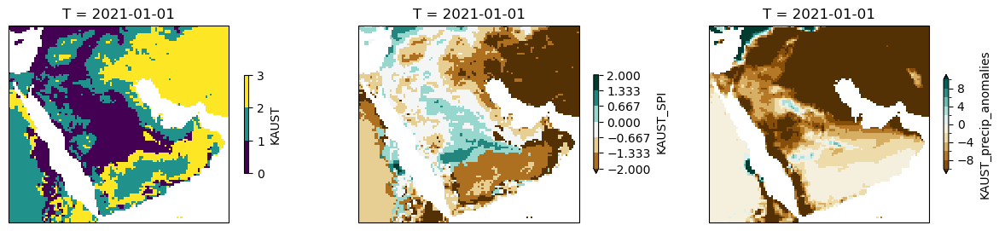

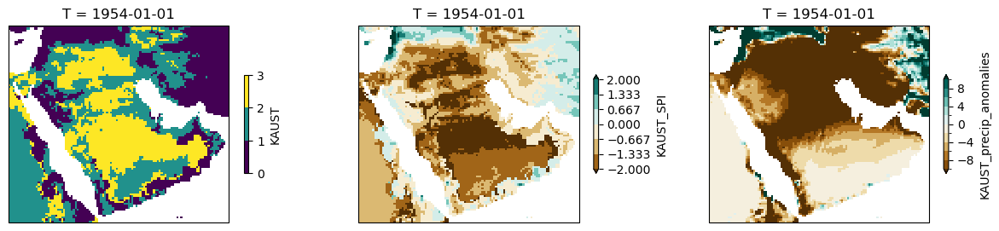

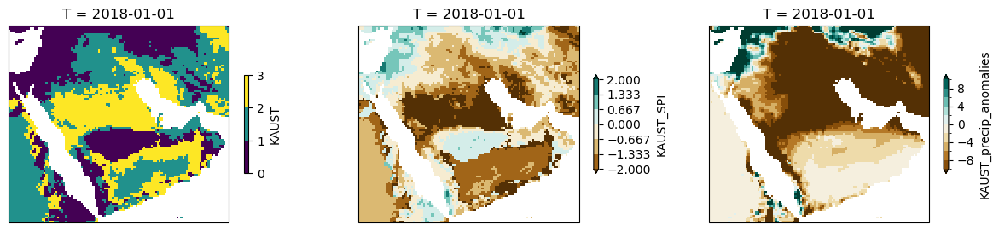

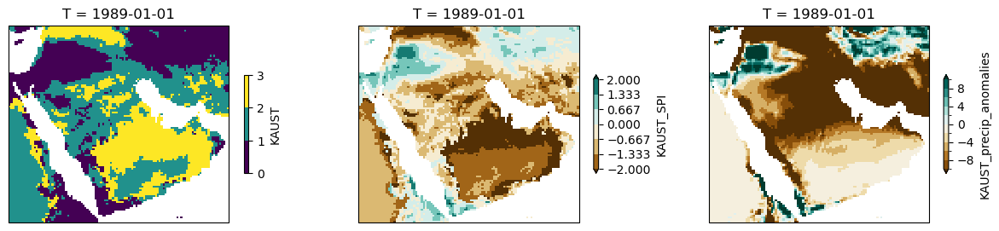

2


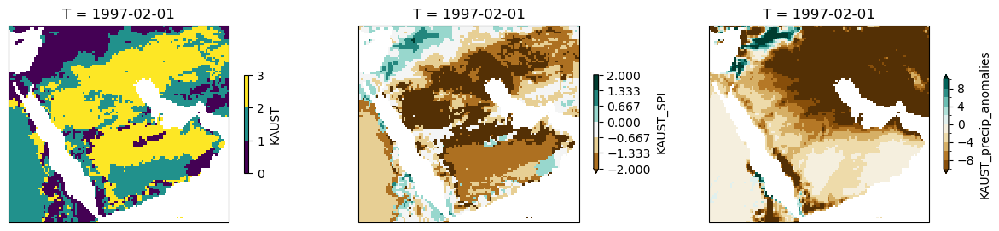

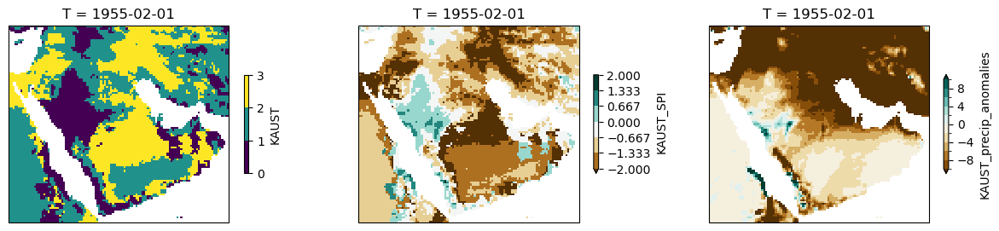

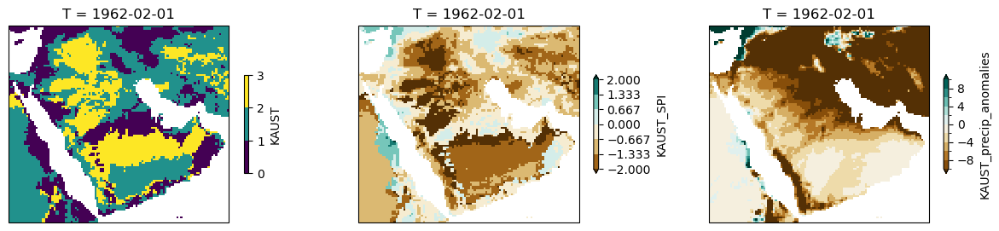

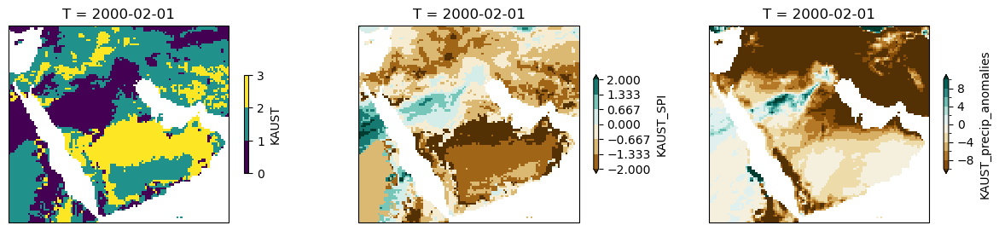

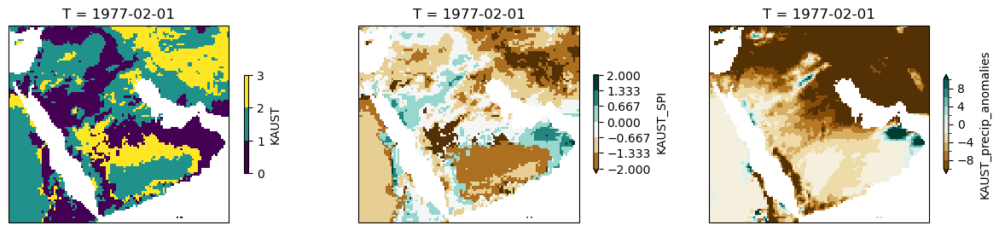

3


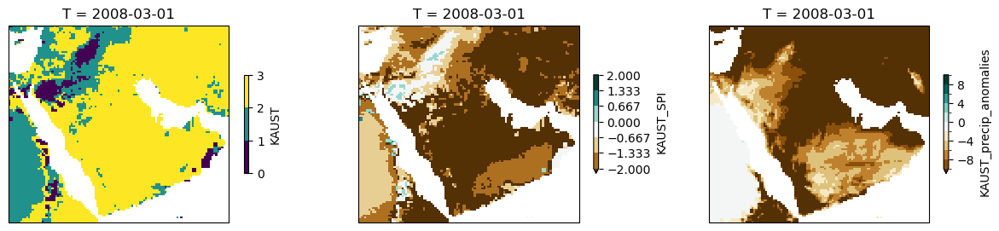

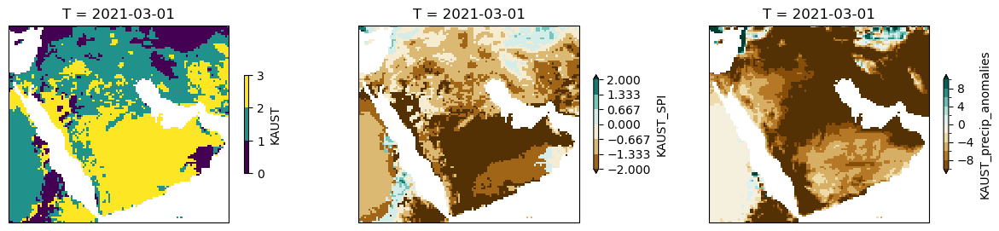

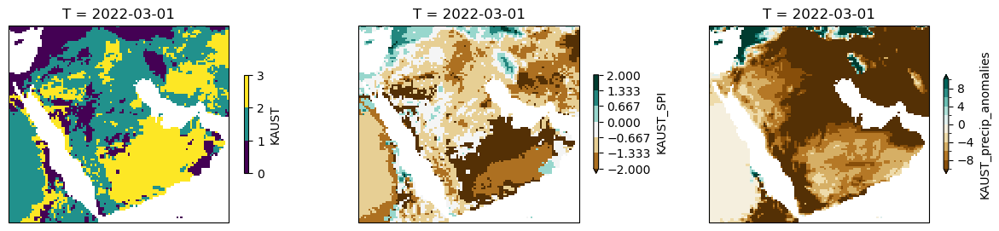

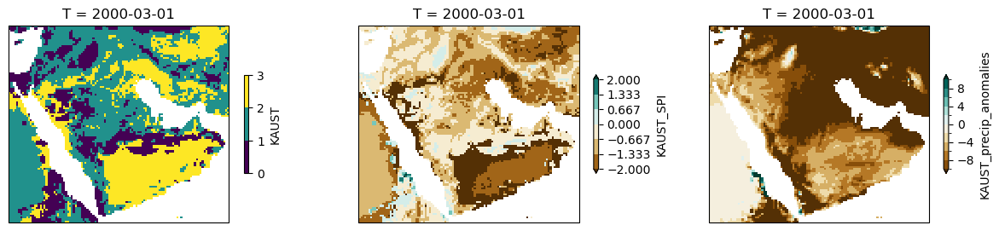

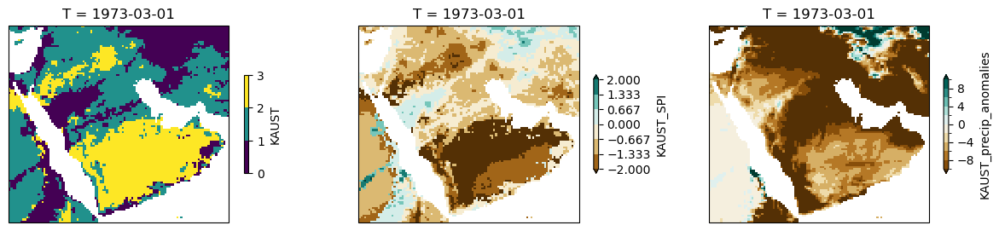

4


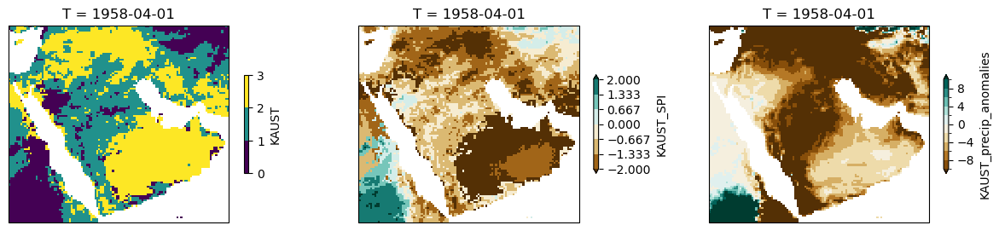

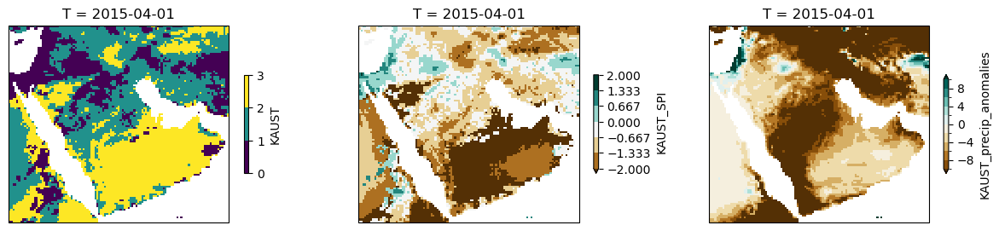

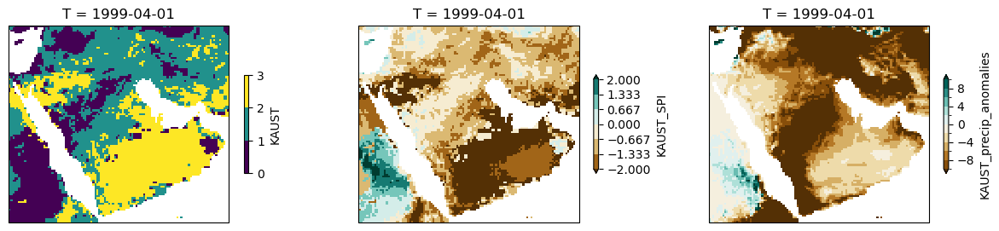

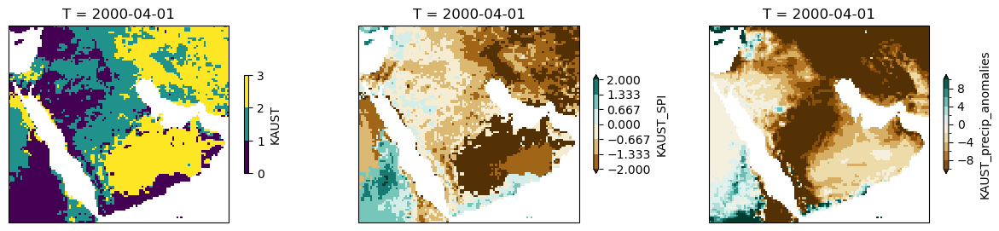

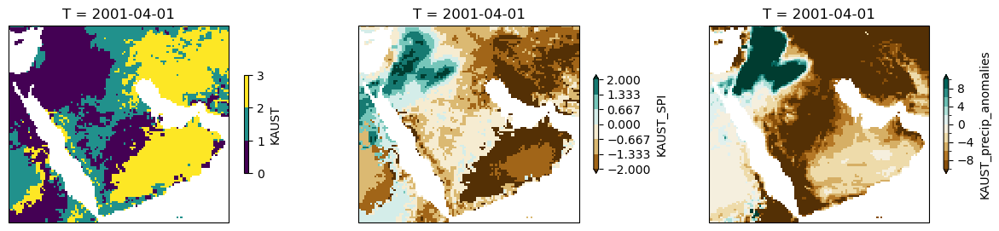

5


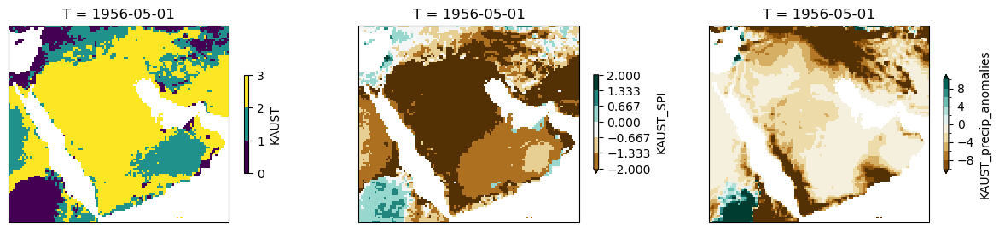

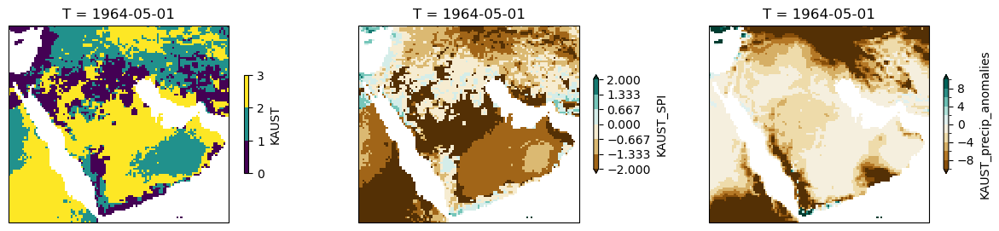

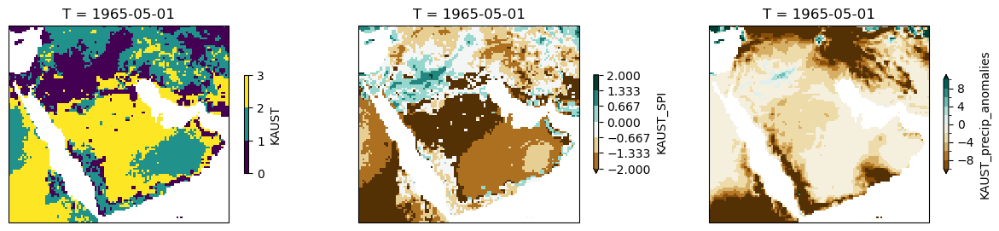

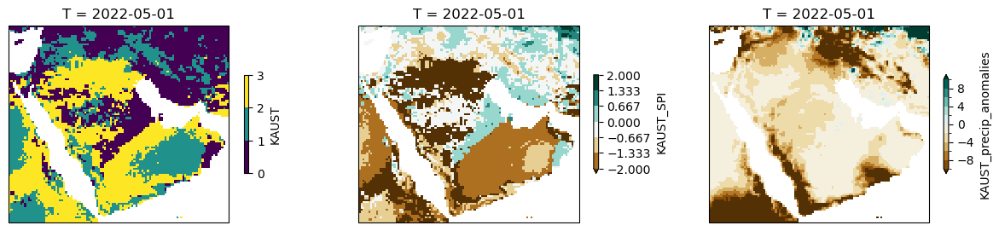

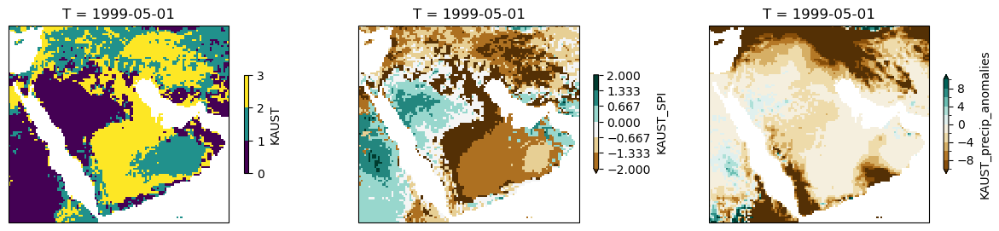

6


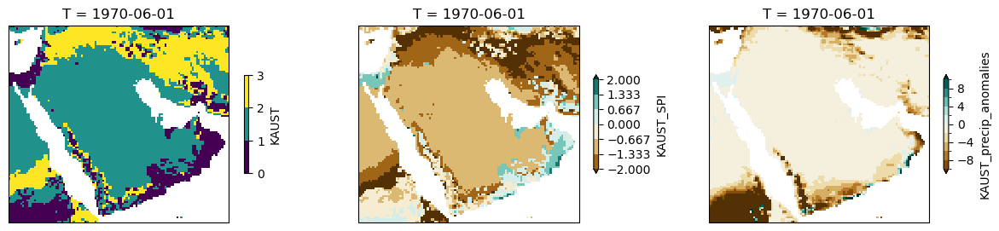

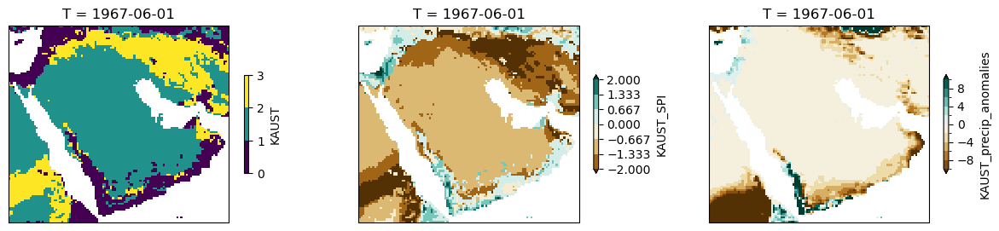

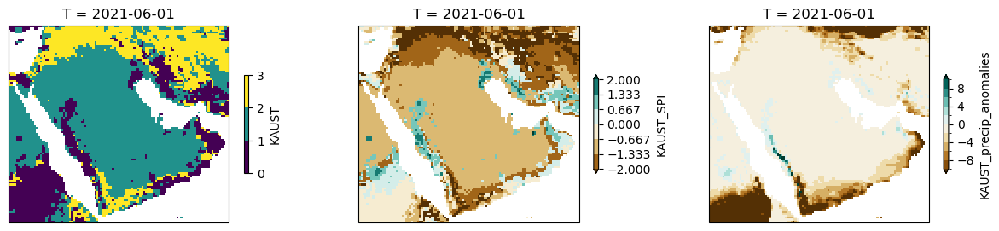

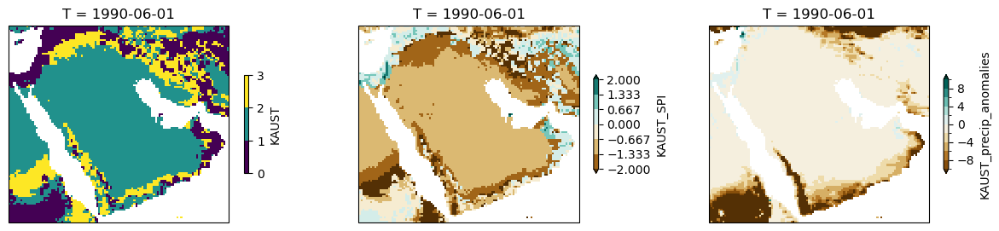

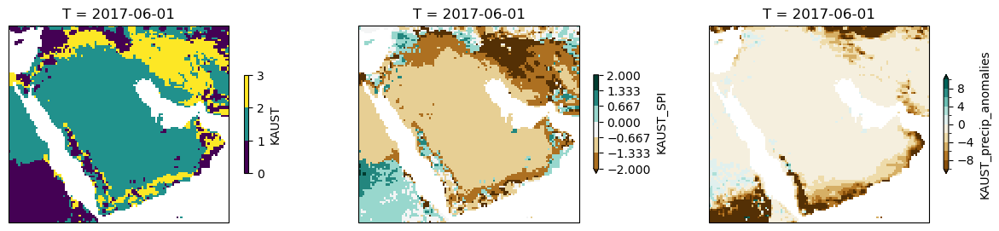

7


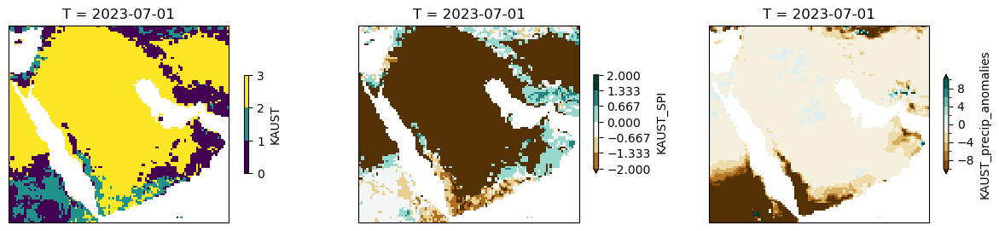

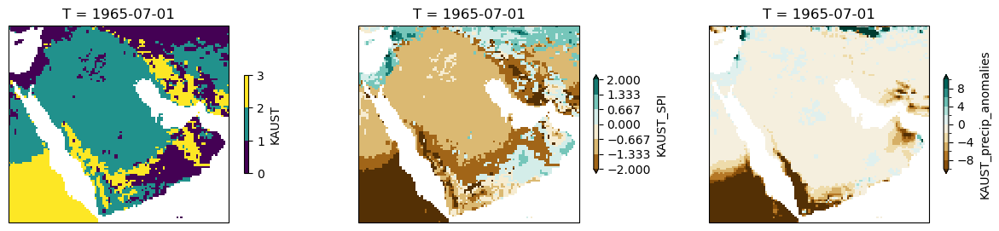

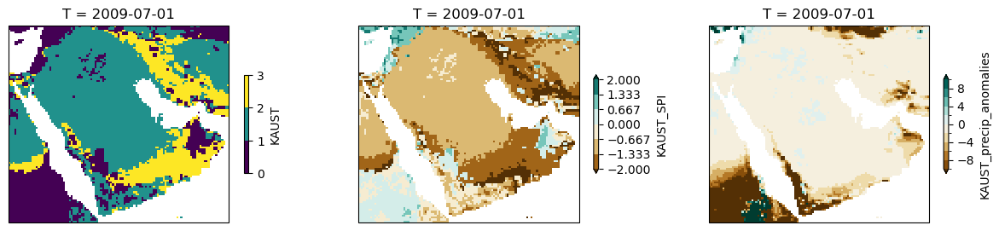

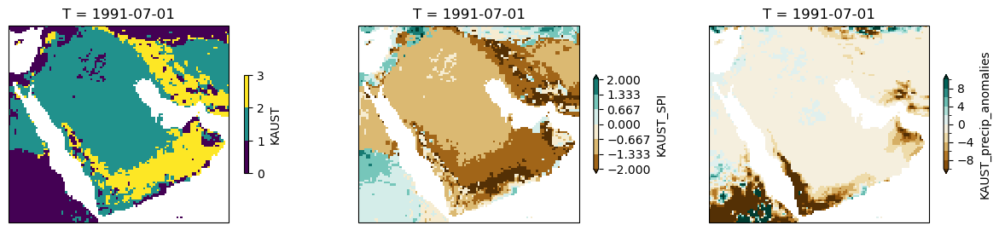

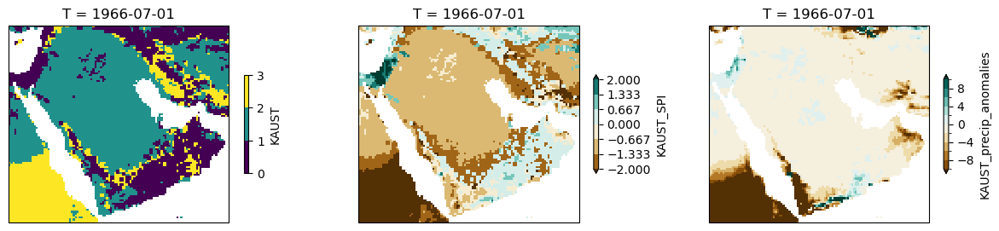

8


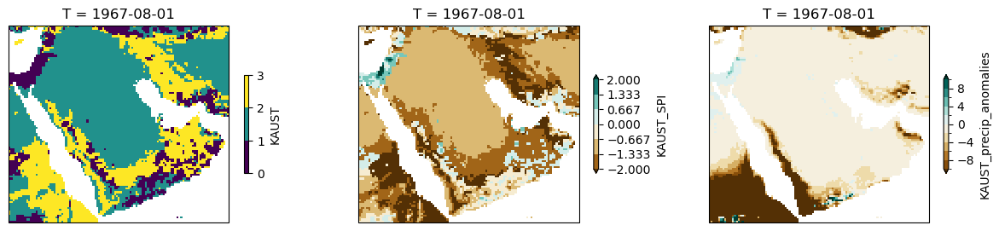

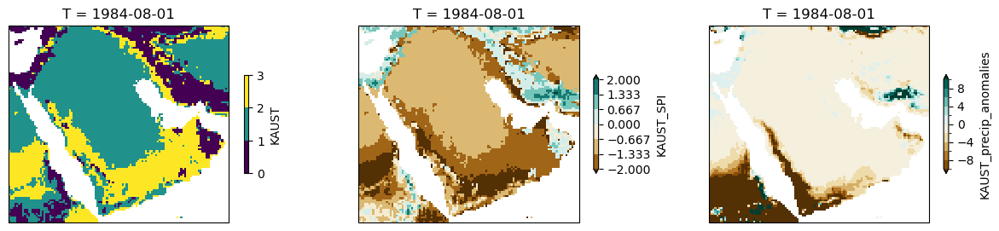

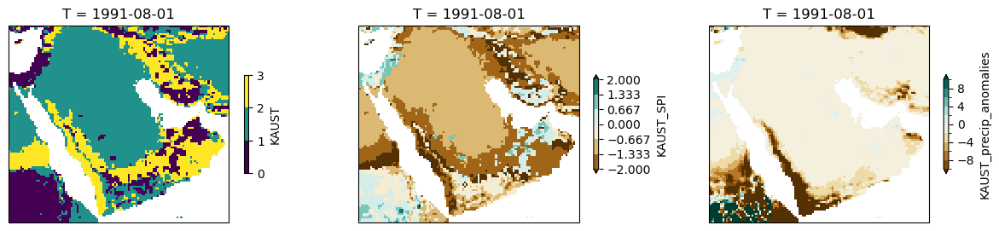

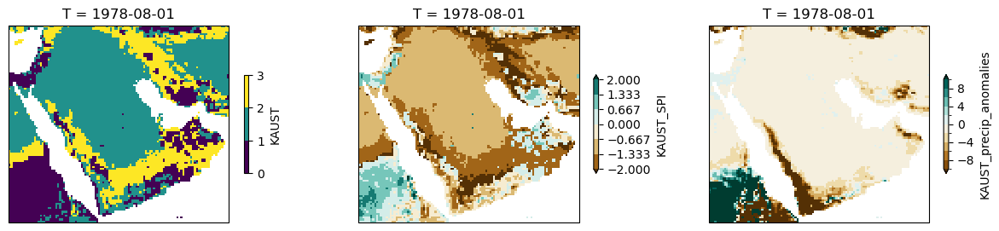

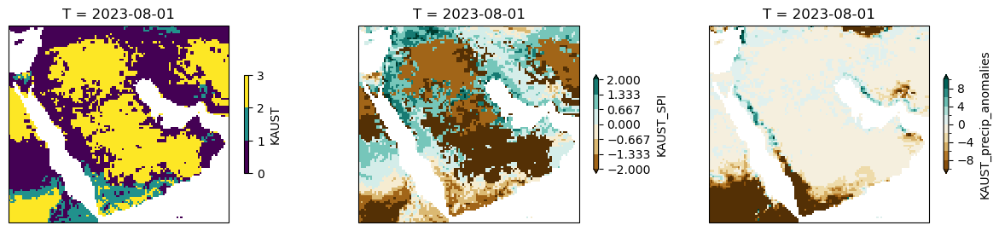

9


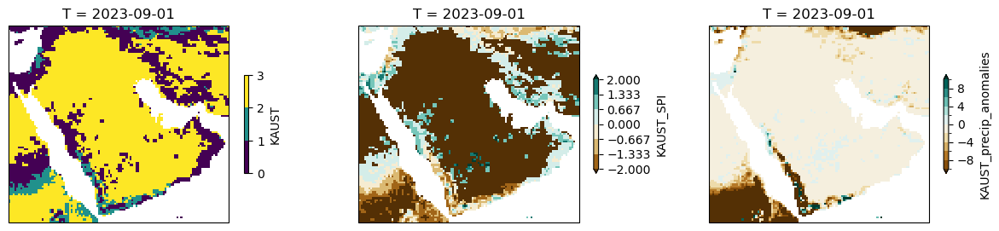

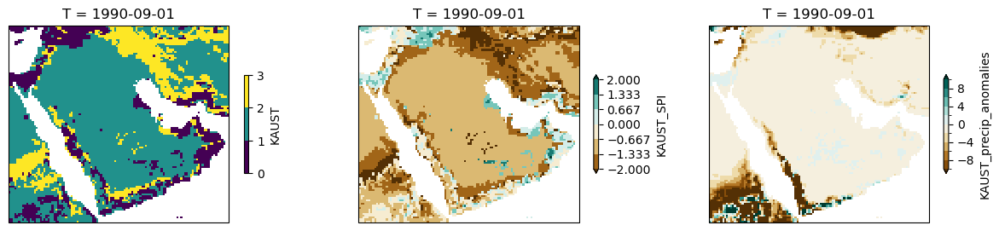

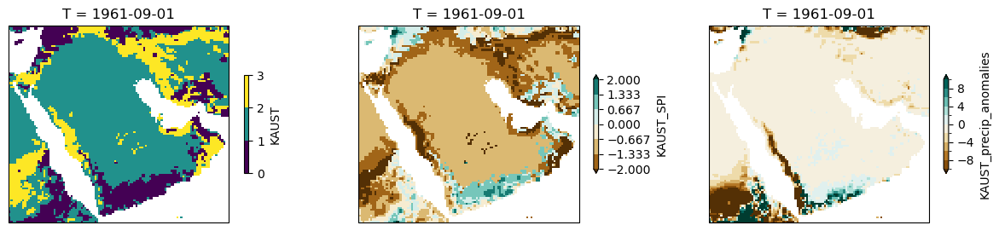

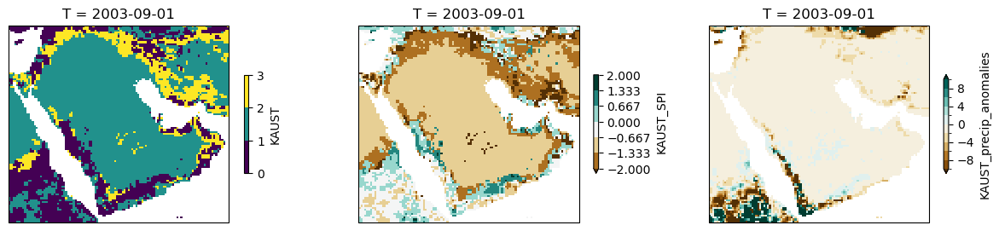

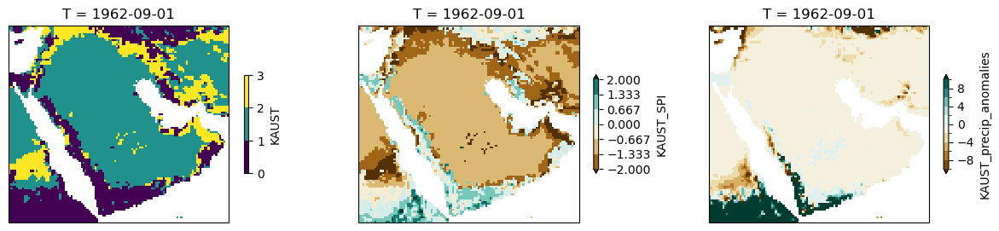

10


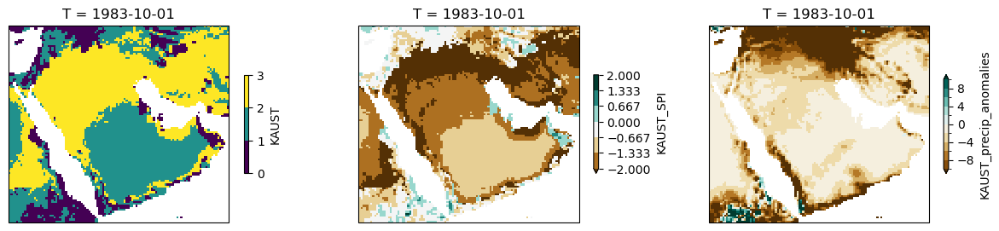

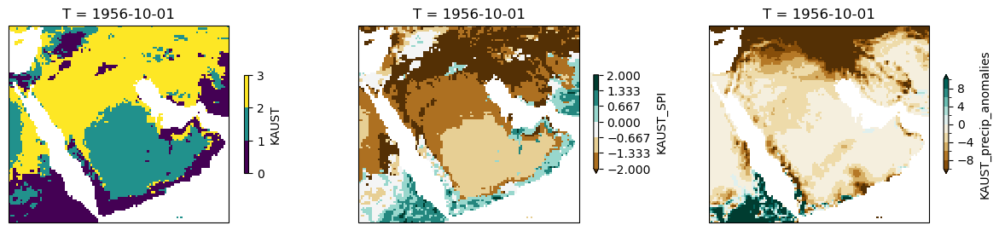

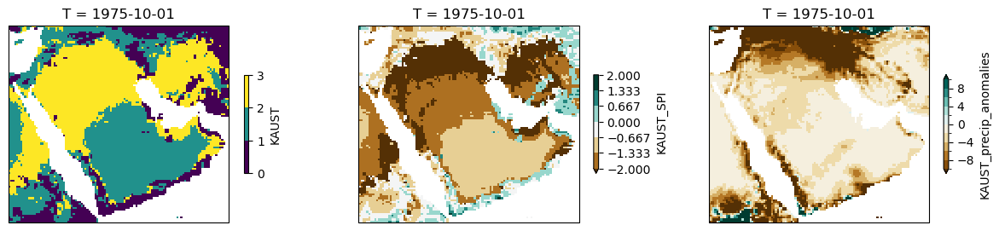

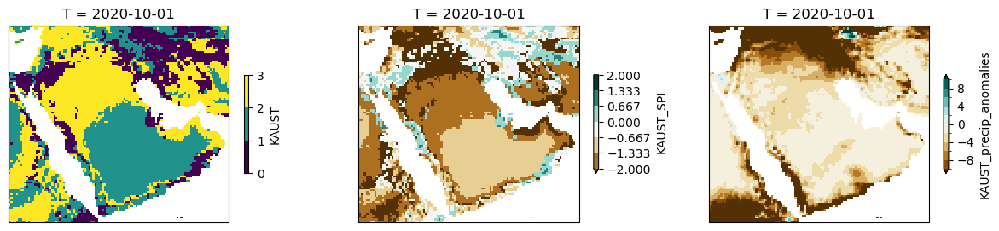

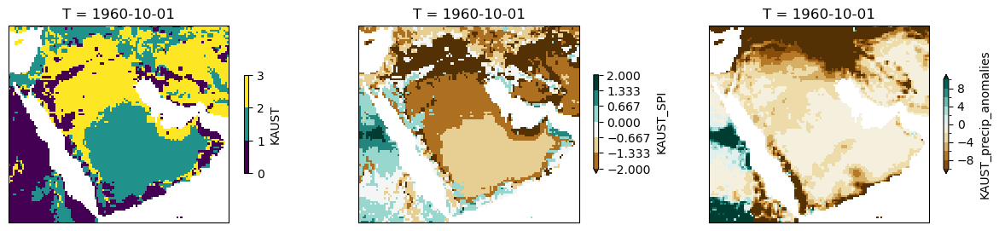

11


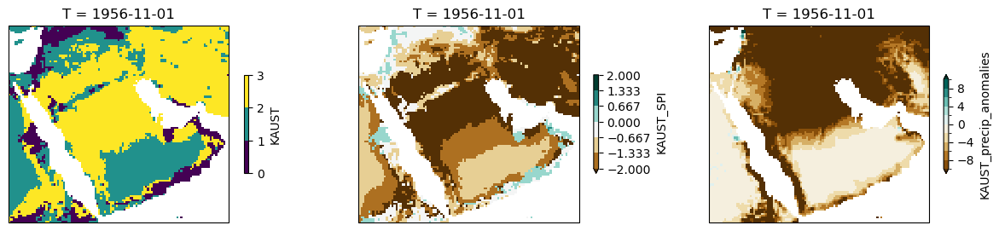

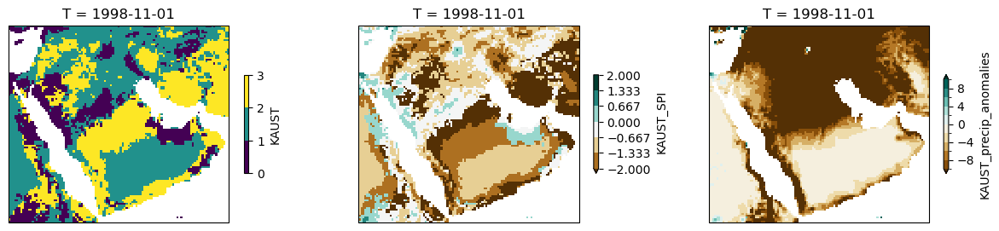

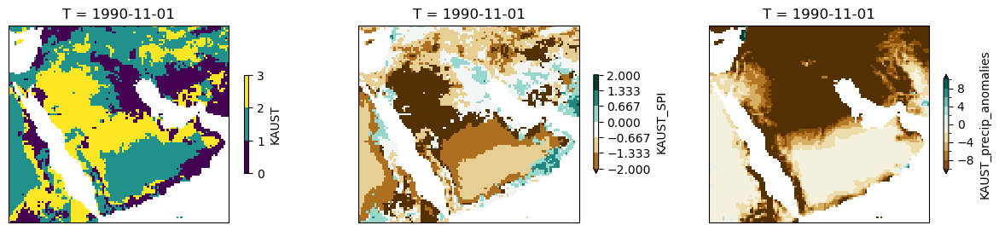

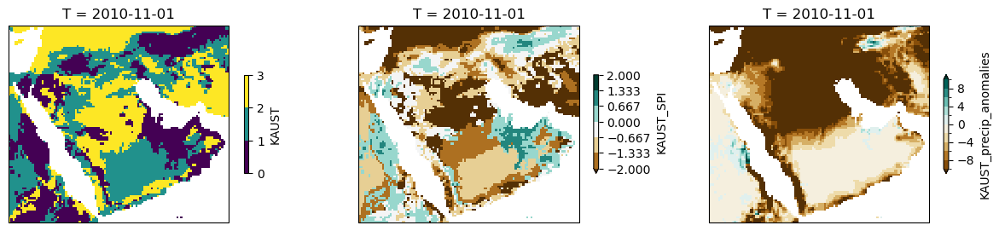

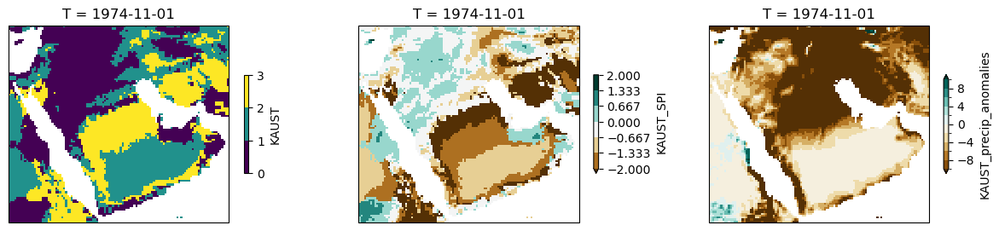

12


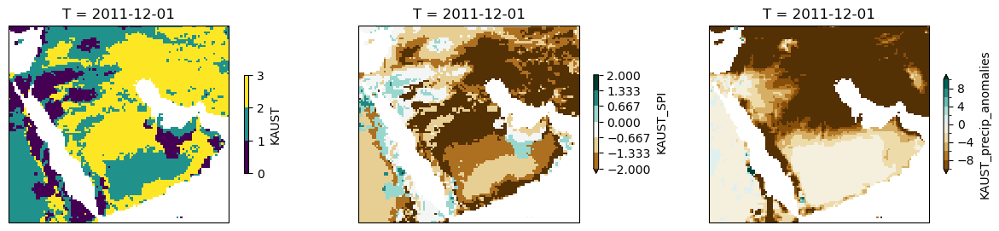

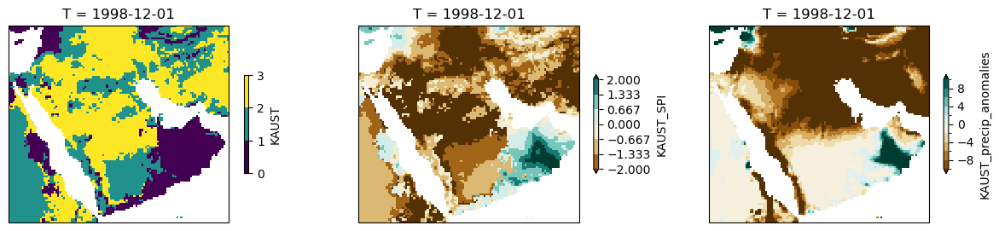

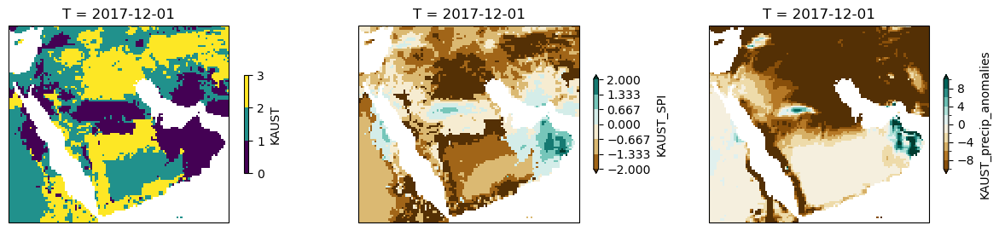

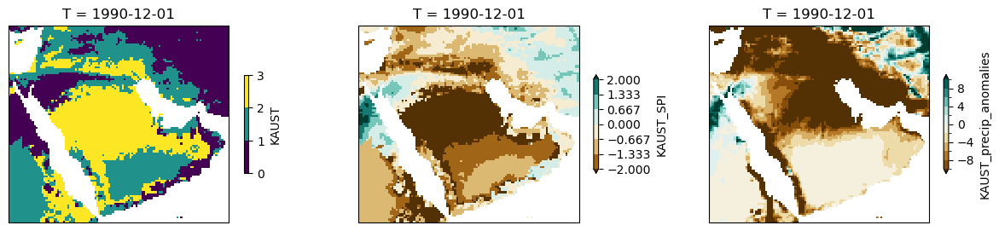

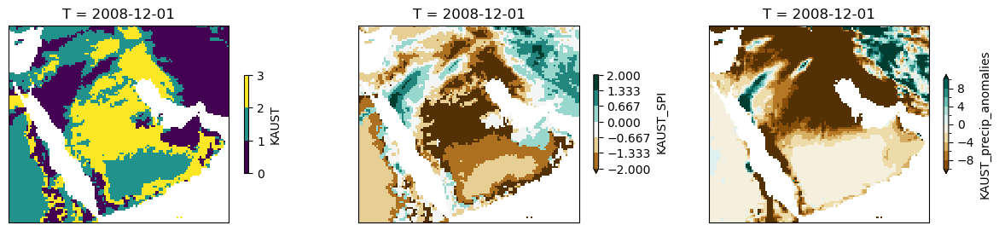

In [39]:
#filter dates_df by month
dates_df['month'] = dates_df.index.month
for month in range(1, 13):
    print("""""""" + str(month) + """""""""""")
    dates_df_month = dates_df[dates_df['month'] == month]
    dates = dates_df_month.index[:5]
    for date in dates:
        fig, ax = plt.subplots(1,3, figsize=(15, 3), subplot_kw={'projection': ccrs.PlateCarree()})

        data_labeled['KAUST'].sel(T=date).plot(levels=4,vmax=3, ax=ax[0],cbar_kwargs={'shrink': 0.5})
        data['KAUST_SPI'].sel(T=date).plot(levels=7,vmax=2, vmin=-2, ax=ax[1],cmap='BrBG',cbar_kwargs={'shrink': 0.5})
        data['KAUST_precip_anomalies'].sel(T=date).plot(levels=11,vmax=10, vmin=-10, ax=ax[2],cmap='BrBG',cbar_kwargs={'shrink': 0.5})
        plt.show()

# Nino correlation

In [212]:
nino = pd.read_table('data/nino.txt', delim_whitespace=True)
#create a datetime index from columns YR and MON
nino['T'] = pd.to_datetime(nino['YR'].astype(str) + '-' + nino['MON'].astype(str))
#start at 1951
nino = nino[nino['T'].dt.year >= 1951]

#add to data xarray with X and Y as coordinates 
nino_xr = xr.Dataset({'NINO': ('T', nino['NINO3.4'].values)}, coords={'T': nino['T']})
data = xr.merge([data, nino_xr])

C:\Users\emile\AppData\Local\Temp\ipykernel_7664\4008843338.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_table is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  nino = pd.read_table('data/nino.txt', delim_whitespace=True)


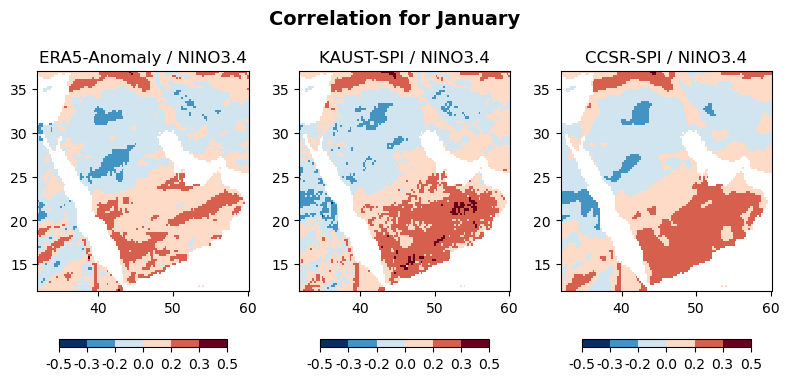

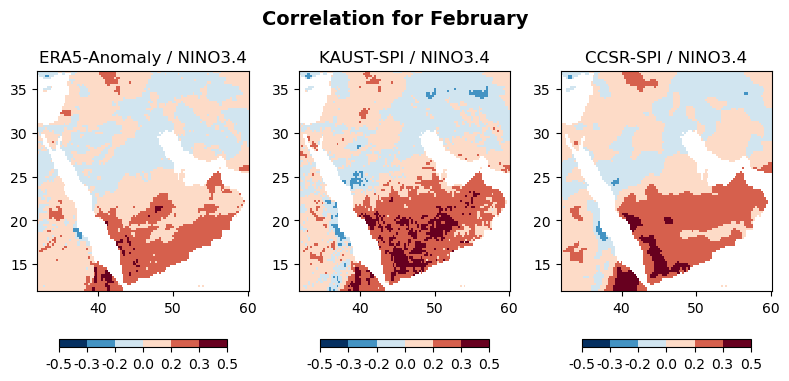

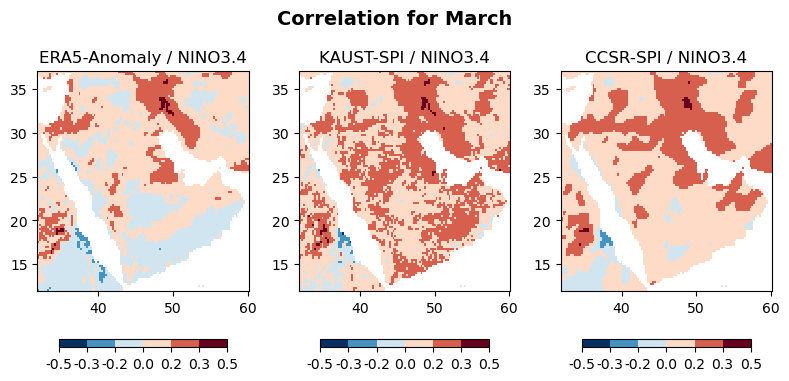

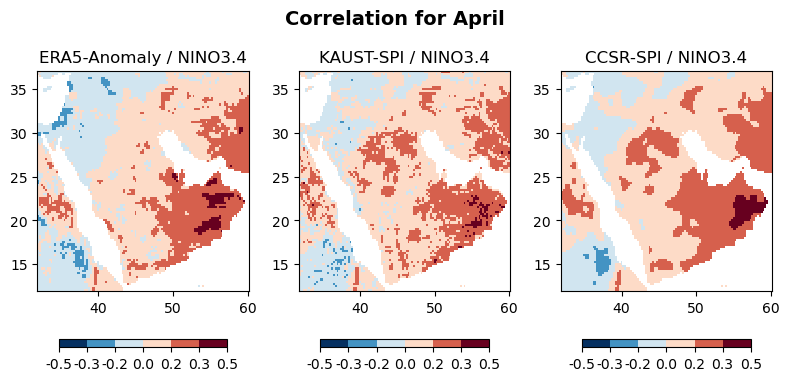

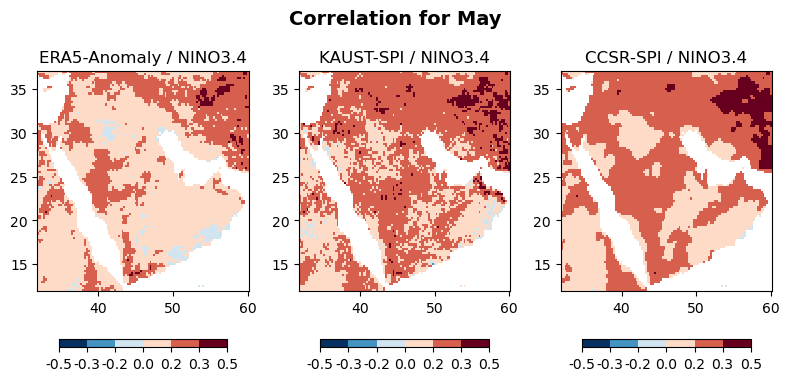

...

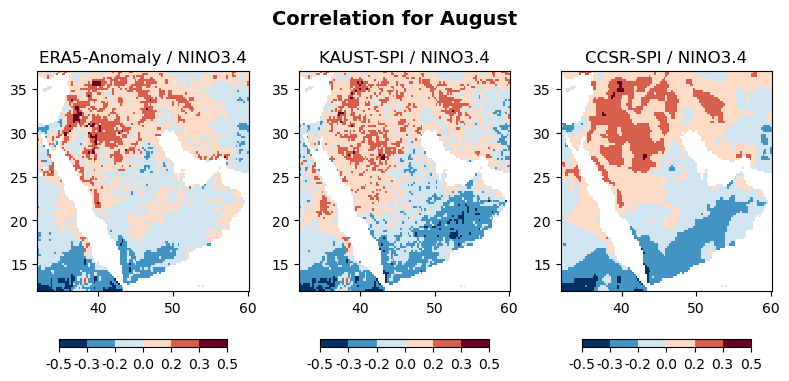

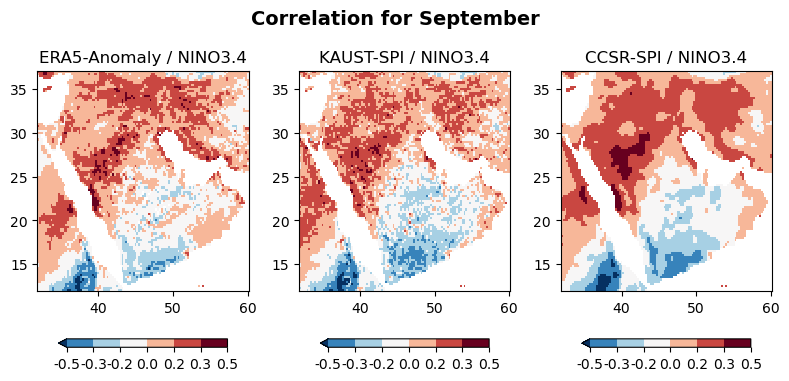

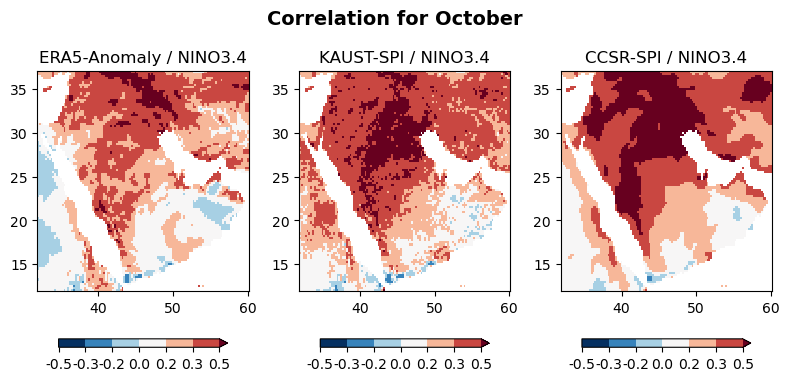

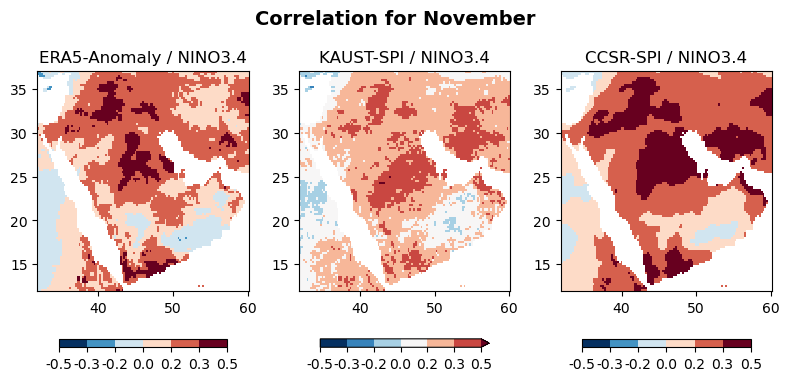

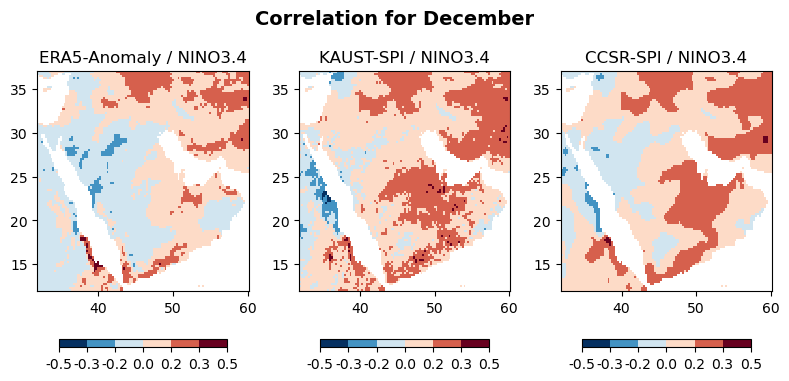

In [194]:
def compute_gridwise_correlation(data, var1, var2, var3, var4,var5):


    # Ensure the time coordinate is in datetime format and extract the month
    if data['T'].dtype != 'datetime64[ns]':
        data['T'] = pd.to_datetime(data['T'].values, format='%m-%Y')
    months = data['T'].dt.month

    
    # Prepare an empty dataset to store the correlations for each month
    corr_ds = xr.Dataset()
    # Loop over each month
    for month in range(1, 13):  # Months 1 to 12
        # Select data for the specific month
        monthly_data = data.where(months == month, drop=True)

        # Compute correlations for each pair of variables using xarray's corr method
        corr1_2 = xr.corr(monthly_data[var1], monthly_data[var2], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr1_3 = xr.corr(monthly_data[var1], monthly_data[var3], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr2_3 = xr.corr(monthly_data[var2], monthly_data[var3], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr1_4 = xr.corr(monthly_data[var1], monthly_data[var4], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr2_4 = xr.corr(monthly_data[var2], monthly_data[var4], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr3_4 = xr.corr(monthly_data[var3], monthly_data[var4], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr1_5 = xr.corr(monthly_data[var1], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr2_5 = xr.corr(monthly_data[var2], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr3_5 = xr.corr(monthly_data[var3], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
        corr4_5 = xr.corr(monthly_data[var4], monthly_data[var5], dim='T').assign_coords(X=monthly_data.X, Y=monthly_data.Y)
    

        # Store the correlation results in the dataset using X and Y coordinates from the first variable
        corr_ds[f'corr_{var1}_{var2}_month_{month}'] = corr1_2
        corr_ds[f'corr_{var1}_{var3}_month_{month}'] = corr1_3
        corr_ds[f'corr_{var2}_{var3}_month_{month}'] = corr2_3
        corr_ds[f'corr_{var1}_{var4}_month_{month}'] = corr1_4
        corr_ds[f'corr_{var2}_{var4}_month_{month}'] = corr2_4
        corr_ds[f'corr_{var3}_{var4}_month_{month}'] = corr3_4
        corr_ds[f'corr_{var1}_{var5}_month_{month}'] = corr1_5
        corr_ds[f'corr_{var2}_{var5}_month_{month}'] = corr2_5
        corr_ds[f'corr_{var3}_{var5}_month_{month}'] = corr3_5
        corr_ds[f'corr_{var4}_{var5}_month_{month}'] = corr4_5


    return corr_ds

# Compute the gridwise correlation between KAUST, CAMS, and SPI
corr_ds = compute_gridwise_correlation(data, 'KAUST_SPI', 'NINO', 'KAUST_precip_anomalies', 'custom_SPI','KAUST_SPEI')
vmin = -0.5
vmax = 0.5
levels = 7

cbar_kwargs = {'shrink': 0.8, 'label': '', 'orientation': 'horizontal','format':'%.1f'}
# Plot the gridwise correlation for each month (var1 vs var2)
for month in range(1, 13):
    month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
    month_name = month_names[month - 1]
    plt.figure(figsize=(8, 4))

    # Plot correlation between KAUST and CAMS
    plt.subplot(1, 3, 1)
    corr_map = corr_ds[f'corr_NINO_KAUST_precip_anomalies_month_{month}']
    corr_map.plot(vmin=vmin, vmax=vmax, cmap='RdBu_r', add_colorbar=True,levels=levels,cbar_kwargs = cbar_kwargs)
    plt.title(f'ERA5-Anomaly / NINO3.4')

    # Plot correlation between KAUST and SPI
    plt.subplot(1, 3, 2)
    corr_map = corr_ds[f'corr_KAUST_SPI_NINO_month_{month}']
    corr_map.plot(vmin=vmin, vmax=vmax, cmap='RdBu_r', add_colorbar=True,levels=levels,cbar_kwargs = cbar_kwargs)
    plt.title(f'KAUST-SPI / NINO3.4')

    # # Plot correlation between CAMS and SPI
    plt.subplot(1, 3, 3)
    corr_map = corr_ds[f'corr_NINO_custom_SPI_month_{month}']
    corr_map.plot(vmin=vmin, vmax=vmax, cmap='RdBu_r', add_colorbar=True,levels=levels,cbar_kwargs = cbar_kwargs)
    plt.title(f'CCSR-SPI / NINO3.4')

    # plt.subplot(1, 5, 4)
    # corr_map = corr_ds[f'corr_KAUST_SPI_custom_SPI_month_{month}']
    # corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=False,levels=11)
    # plt.title(f'KAUST-SPI / CCSR-SPI - Month {month}')

    # plt.subplot(1, 5, 5)
    # corr_map = corr_ds[f'corr_KAUST_precip_anomalies_custom_SPI_month_{month}']
    # corr_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=True,levels=11)
    # plt.title(f'CCSR SPI / ERA5-prcp - Month {month}')
    #remove X and Y labels
    for ax in plt.gcf().axes:
        ax.set(xlabel='', ylabel='')
    plt.suptitle(f'Correlation for {month_name}', fontsize=14,fontweight='bold')
    plt.tight_layout()
    plt.show()

C:\Users\emile\AppData\Local\Temp\ipykernel_7664\3791991681.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])


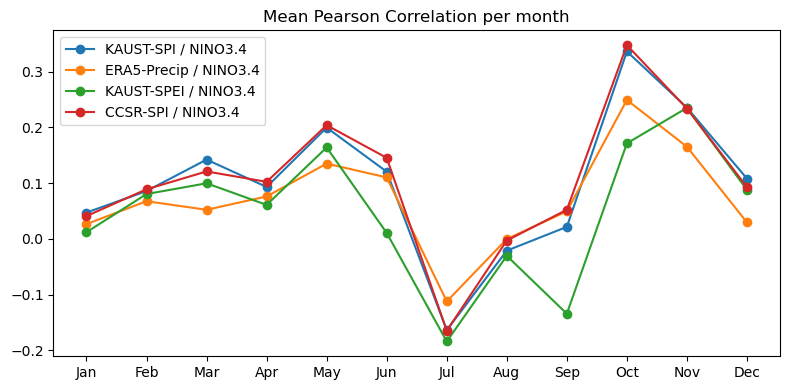

In [87]:
corr_kaust_nino = np.zeros(12)
corr_era5_nino = np.zeros(12)
corr_spei_nino = np.zeros(12)
corr_ccsr_nino = np.zeros(12)
months = np.arange(1, 13)
for month in months:
    data_month = data.where(data['T'].dt.month == month, drop=True)

    corr_mat_kaust_nino = xr.corr(data_month['KAUST_SPI'], data_month['NINO'], dim='T')
    corr_mat_spei_nino= xr.corr(data_month['KAUST_SPEI'], data_month['NINO'], dim='T')
    corr_mat_era5_nino= xr.corr(data_month['NINO'], data_month['KAUST_precip_anomalies'], dim='T')
    corr_mat_ccsr_nino = xr.corr(data_month['custom_SPI'], data_month['NINO'], dim='T')


    corr_kaust_nino[month-1] = xr.where(np.isinf(corr_mat_kaust_nino), np.nan, corr_mat_kaust_nino).mean()
    corr_era5_nino[month-1] = xr.where(np.isinf(corr_mat_era5_nino), np.nan, corr_mat_era5_nino).mean()
    corr_spei_nino[month-1] = xr.where(np.isinf(corr_mat_spei_nino), np.nan, corr_mat_spei_nino).mean()
    corr_ccsr_nino[month-1] = xr.where(np.isinf(corr_mat_ccsr_nino), np.nan, corr_mat_ccsr_nino).mean()


# Create a figure and axis
fig, ax = plt.subplots(figsize=(8, 4))

#dataframe with correlation values
df = pd.DataFrame({'Month': months, 'KAUST-SPI / NINO3.4': corr_kaust_nino,
                    'ERA5-Precip / NINO3.4': corr_era5_nino, 
                    'KAUST-SPEI / NINO3.4': corr_spei_nino, 
                    'CCSR-SPI / NINO3.4': corr_ccsr_nino})

#bar plot
#df.plot(x='Month', kind='bar', ax=ax)

# # Plot the correlation values
#ax.plot(months, corr_kaust_custom, label='KAUST-SPI / CCSR-SPI', marker='o')
ax.plot(months, corr_kaust_nino, label='KAUST-SPI / NINO3.4', marker='o')
ax.plot(months, corr_era5_nino, label='ERA5-Precip / NINO3.4', marker='o')
ax.plot(months, corr_spei_nino, label='KAUST-SPEI / NINO3.4', marker='o')
ax.plot(months, corr_ccsr_nino, label='CCSR-SPI / NINO3.4', marker='o')
#ticks every month
ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_xticks(months)
plt.legend()
plt.title('Mean Pearson Correlation per month')
plt.tight_layout()

# Nino OLS

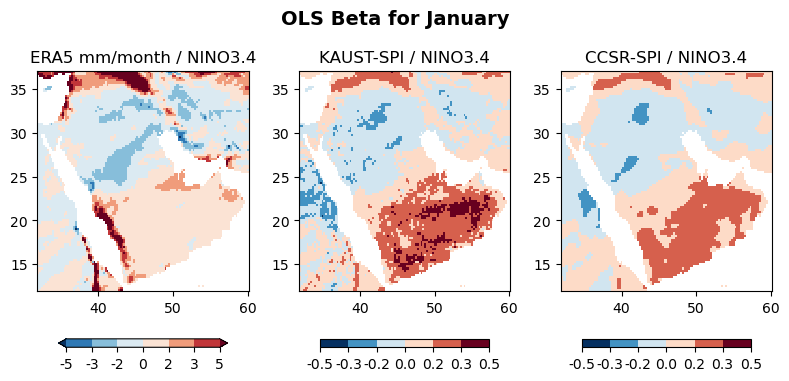

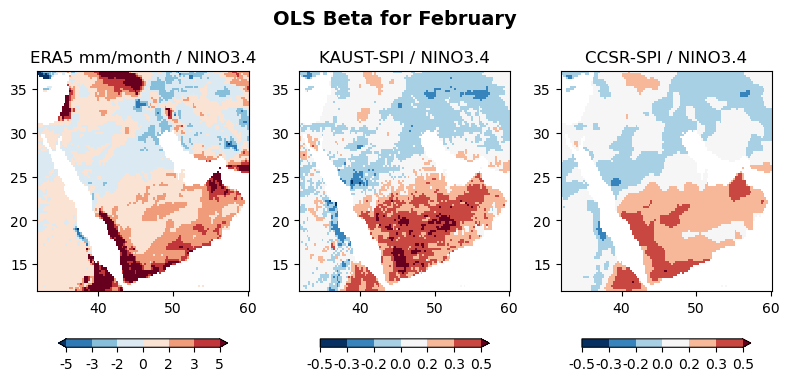

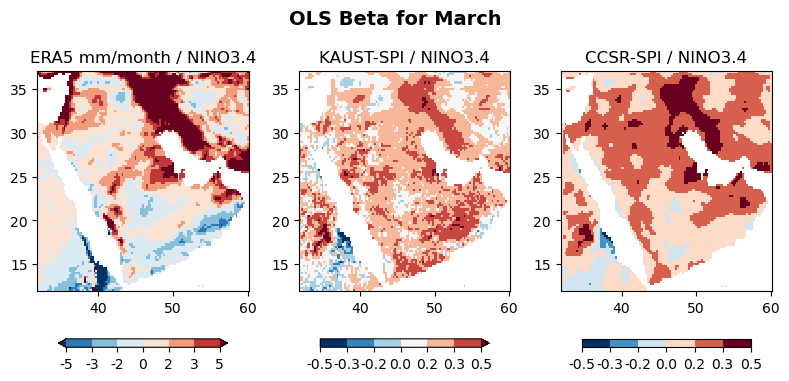

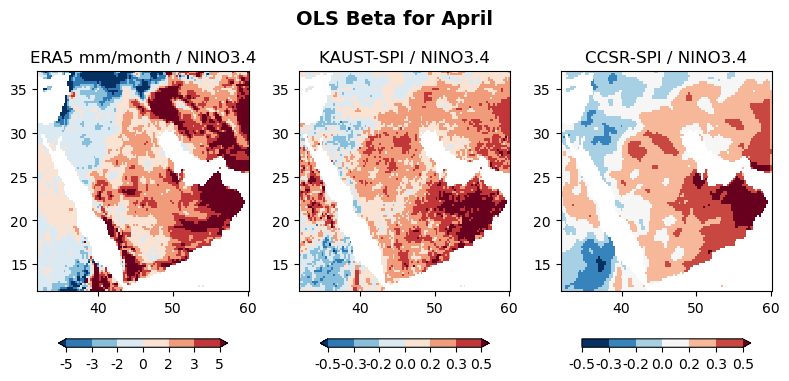

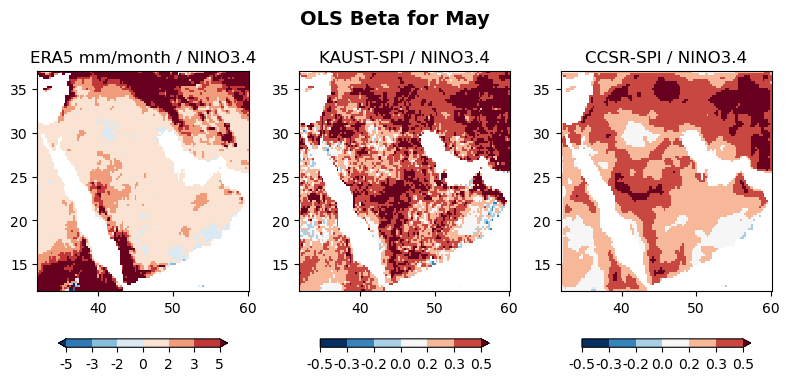

...

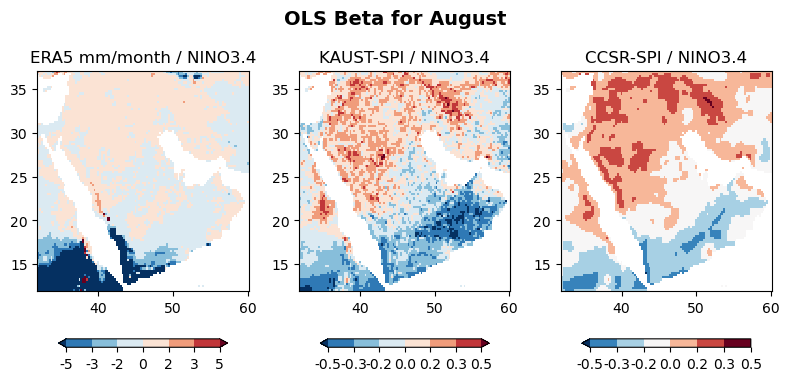

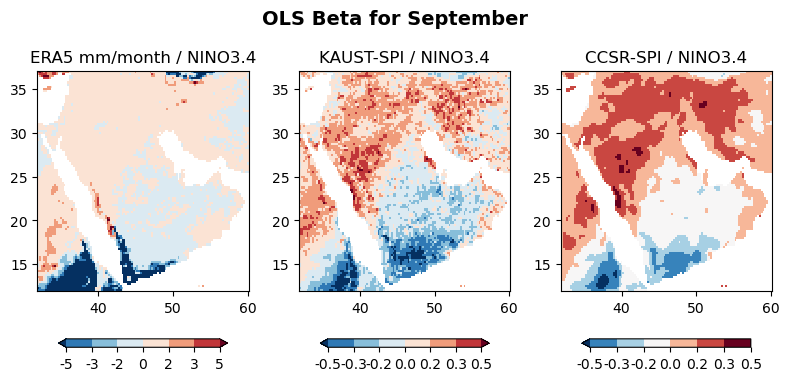

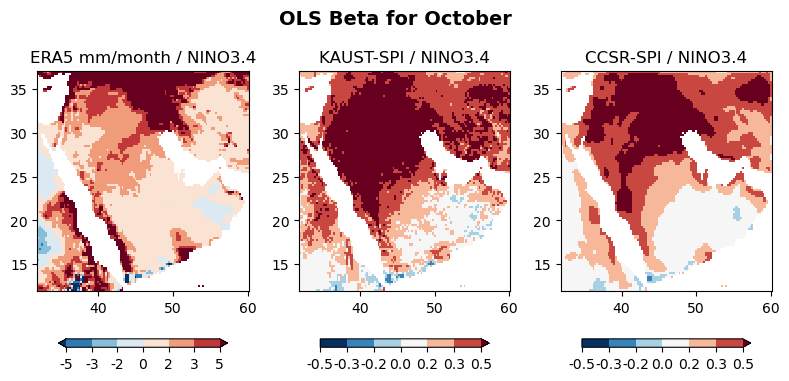

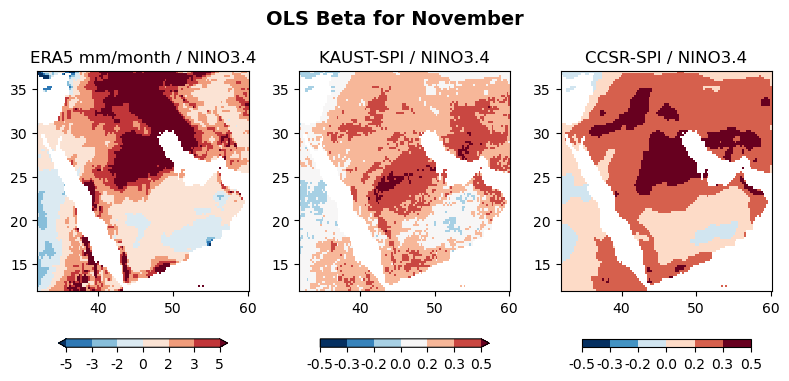

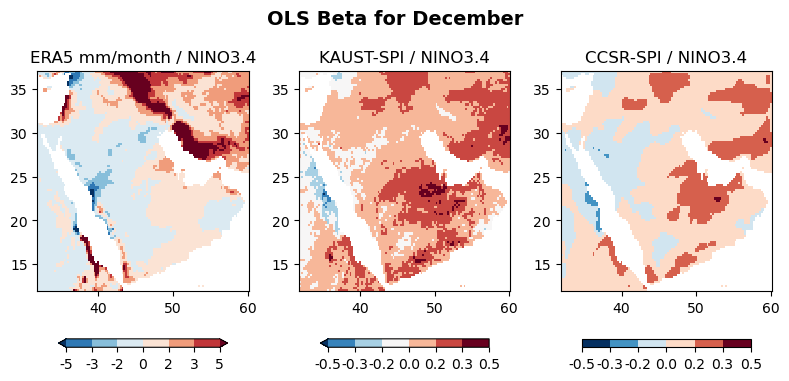

In [227]:
def compute_gridwise_beta(data, varx, vary1, vary2, vary3):
    # Ensure the time coordinate is in datetime format and extract the month
    if data['T'].dtype != 'datetime64[ns]':
        data['T'] = pd.to_datetime(data['T'].values, format='%m-%Y')
    months = data['T'].dt.month

    # Prepare an empty dataset to store the beta coefficients for each month
    beta_ds = xr.Dataset()

    # Loop over each month
    for month in range(1, 13):  # Months 1 to 12
        # Select data for the specific month
        monthly_data = data.where(months == month, drop=True)

        # Compute beta (slope) for each pair of variables using covariance / variance
        beta_x_y1 = xr.cov(monthly_data[vary1], monthly_data[varx], dim='T') / xr.cov(monthly_data[varx], monthly_data[varx], dim='T')
        beta_x_y2 = xr.cov(monthly_data[vary2], monthly_data[varx], dim='T') / xr.cov(monthly_data[varx], monthly_data[varx], dim='T')
        beta_x_y3 = xr.cov(monthly_data[vary3], monthly_data[varx], dim='T') / xr.cov(monthly_data[varx], monthly_data[varx], dim='T')

        # Assign the computed betas to the dataset without trying to add new coordinates
        beta_ds[f'beta_{varx}_{vary1}_month_{month}'] = beta_x_y1
        beta_ds[f'beta_{varx}_{vary2}_month_{month}'] = beta_x_y2
        beta_ds[f'beta_{varx}_{vary3}_month_{month}'] = beta_x_y3

    return beta_ds

# Compute the gridwise correlation between KAUST, CAMS, and SPI
beta_ds = compute_gridwise_beta(data, 'NINO', 'custom_SPI', 'KAUST_SPI', 'KAUST_precip')
vmin = -0.5
vmax = 0.5
levels = 7

cbar_kwargs = {'shrink': 0.8, 'label': '', 'orientation': 'horizontal','format':'%.1f'}
# Plot the gridwise correlation for each month (var1 vs var2)
for month in range(1, 13):
    month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
    month_name = month_names[month - 1]
    plt.figure(figsize=(8, 4))

    # Plot correlation between KAUST and CAMS
    plt.subplot(1, 3, 1)
    beta_map = beta_ds[f'beta_NINO_KAUST_precip_month_{month}']
    beta_map.plot(vmin=-5, vmax=5, cmap='RdBu_r', add_colorbar=True,levels=levels,cbar_kwargs = {'shrink': 0.8, 'label': '', 'orientation': 'horizontal','format':'%.0f'})
    plt.title(f'ERA5 mm/month / NINO3.4')

    # Plot correlation between KAUST and SPI
    plt.subplot(1, 3, 2)
    beta_map = beta_ds[f'beta_NINO_KAUST_SPI_month_{month}']
    beta_map.plot(vmin=vmin, vmax=vmax, cmap='RdBu_r', add_colorbar=True,levels=levels,cbar_kwargs = cbar_kwargs)
    plt.title(f'KAUST-SPI / NINO3.4')

    # # Plot correlation between CAMS and SPI
    plt.subplot(1, 3, 3)
    beta_map = beta_ds[f'beta_NINO_custom_SPI_month_{month}']
    beta_map.plot(vmin=vmin, vmax=vmax, cmap='RdBu_r', add_colorbar=True,levels=levels,cbar_kwargs = cbar_kwargs)
    plt.title(f'CCSR-SPI / NINO3.4')

    # plt.subplot(1, 5, 4)
    # beta_map = beta_ds[f'beta_KAUST_SPI_custom_SPI_month_{month}']
    # beta_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=False,levels=11)
    # plt.title(f'KAUST-SPI / CCSR-SPI - Month {month}')

    # plt.subplot(1, 5, 5)
    # beta_map = beta_ds[f'beta_KAUST_precip_anomalies_custom_SPI_month_{month}']
    # beta_map.plot(vmin=-1, vmax=1, cmap='RdBu_r', add_colorbar=True,levels=11)
    # plt.title(f'CCSR SPI / ERA5-prcp - Month {month}')
    #remove X and Y labels
    for ax in plt.gcf().axes:
        ax.set(xlabel='', ylabel='')
    plt.suptitle(f'OLS Beta for {month_name}', fontsize=14,fontweight='bold')
    plt.tight_layout()
    plt.show()